<div align="center">
    <h1>Benchmarking</h1>
    <a href="https://github.com/bernalde">David E. Bernal Neira</a>
    <br>
    <i>Davidson School of Chemical Engineering, Purdue University</i>
    <br>
    <br>
    <a href="https://github.com/pedromxavier">Pedro Maciel Xavier</a>
    <br>
    <i>Davidson School of Chemical Engineering, Purdue University</i>
    <br>
    <i>Computer Science &amp; Systems Engineering Program, Federal University of Rio de Janeiro</i>
    <br>
    <i>PSR Energy Consulting &amp; Analytics</i>
    <br>
    <br>
    <a href="https://github.com/jvpcms">João Victor Souza</a>
    <br>
    <i>Computer Engineering Department, Military Institute of Engineering (IME)</i>
    <br>
    <br>
    <a href="https://colab.research.google.com/github/SECQUOIA/QuIP/blob/main/notebooks_jl/5-Benchmarking.ipynb" target="_parent">
        <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
    </a>
    <a href="https://secquoia.github.io/">
        <img src="https://img.shields.io/badge/🌲⚛️🌐-SECQUOIA-blue" alt="SECQUOIA"/>
    </a>
</div>


**Environment setup**

For local execution from the repository root, run `uv sync --group qubo` and `make setup-julia NOTEBOOK=notebooks_jl/5-Benchmarking.ipynb` before launching Jupyter. That setup command now installs the Julia kernel project under `scripts/`, including `IJulia`, and then instantiates the notebook-specific environment under `notebooks_jl/envs/5-Benchmarking`.

This notebook should open directly with the **Julia** runtime in Google Colab. If it does not, switch the runtime before running the next cell.
The setup cell will clone `SECQUOIA/QuIP` into the Colab workspace when needed, activate `notebooks_jl/envs/5-Benchmarking/Project.toml`, install the Python D-Wave Ocean packages into the Colab Python runtime, and print progress for clone, activate, instantiate, and package-load steps. Package precompilation still happens as needed during setup. The first Colab run can still take several minutes.


In [1]:
function load_notebook_bootstrap()
    candidates = (
        joinpath(pwd(), "scripts", "notebook_bootstrap.jl"),
        joinpath(pwd(), "..", "scripts", "notebook_bootstrap.jl"),
        joinpath(pwd(), "QuIP", "scripts", "notebook_bootstrap.jl"),
        joinpath("/content", "QuIP", "scripts", "notebook_bootstrap.jl"),
    )

    for candidate in candidates
        if isfile(candidate)
            include(candidate)
            return nothing
        end
    end

    in_colab = haskey(ENV, "COLAB_RELEASE_TAG") || haskey(ENV, "COLAB_JUPYTER_IP") || isdir(joinpath("/content", "sample_data"))
    if in_colab
        repo_dir = get(ENV, "QUIP_REPO_DIR", joinpath(pwd(), "QuIP"))
        if !isdir(repo_dir)
            println("[bootstrap] Cloning SECQUOIA/QuIP into $repo_dir")
            run(`git clone --depth 1 https://github.com/SECQUOIA/QuIP.git $repo_dir`)
        end
        include(joinpath(repo_dir, "scripts", "notebook_bootstrap.jl"))
        return nothing
    end

    error("Could not locate scripts/notebook_bootstrap.jl from $(pwd()).")
end

load_notebook_bootstrap()

BOOTSTRAP = Base.invokelatest(QuIPNotebookBootstrap.bootstrap_notebook, "5-Benchmarking")

QUIP_REPO_DIR = BOOTSTRAP.repo_dir
JULIA_NOTEBOOKS_DIR = BOOTSTRAP.notebooks_dir
JULIA_PROJECT_DIR = BOOTSTRAP.project_dir
IN_COLAB = BOOTSTRAP.in_colab


[12:59:04] Notebook project key: 5-Benchmarking


[12:59:04] Google Colab runtime detected: false


[12:59:04] Using Python runtime: /home/bernalde/repos/QuIP/.venv/bin/python3


[12:59:04] Activating project at `/home/bernalde/repos/QuIP/notebooks_jl/envs/5-Benchmarking`


  Activating 

[12:59:04] Instantiating Julia packages


project at `~/repos/QuIP/notebooks_jl/envs/5-Benchmarking`


  1.378786 seconds (2.83 M allocations: 220.610 MiB, 4.48% gc time, 29.77% compilation time: 41% of which was recompilation)
[12:59:06] Loading notebook packages


[12:59:14] Working directory set to /home/bernalde/repos/QuIP/notebooks_jl


[12:59:14] Notebook bootstrap complete


false

## Benchmarking

With the growing availability of unconventional hardware, new algorithms, and increasingly optimized software for optimization problems, a natural question is: which approach is better?
We will call a particular hardware, algorithm, and software combination a solver.
The same question also appears when tuning a single solver: which hyperparameter setting is best for a given problem and resource budget?

In the idealized case where resources are effectively unlimited and the target problem is known in advance, one could exhaustively try every parameter setting for that instance and keep the best one.
In practice, that is rarely possible: the problem is usually not known a priori, and time, memory, and energy are limited.
A more realistic setting is to study a family of similar instances offline, spend additional resources to benchmark that family, and then use those results to guide how we solve a new instance drawn from the same family.


## Example
For illustration purposes, we will use an example that you are already familiar with, which is an Ising model.
As a solver, we will use D-Wave's Neal simulated annealing sampler through `DWave.jl`.


## Ising model
We formulate the Ising models with `JuMP` and `QUBO.jl`.
Exact enumeration and random baselines use `QUBO.jl` samplers, and `QUBOTools.jl` is used to analyze and visualize the resulting samples. Simulated annealing uses `DWave.jl`'s Neal wrapper with the same seeded benchmarking workflow used in the Python notebook.


### Problem statement

We pose the Ising problem as the following optimization problem:

$$
\min_{s \in \{ \pm 1 \}^n} H(s) = \min_{s \in \{ \pm 1 \}^n} \sum_{(i, j) \in E(G)} J_{i,j}s_is_j + \sum_{i \in V(G)} h_is_i + \beta
$$

where we optimize over spins $s \in \{ \pm 1 \}^n$, on a constrained graph $G(V,E)$, where the quadratic coefficients are $J_{i,j}$ and the linear coefficients are $h_i$.
We also include an arbitrary offset of the Ising model $\beta$.

### Example 1

Suppose we have an Ising model defined from

$$
h = \begin{bmatrix}
145.0 \\ 122.0 \\ 122.0 \\ 266.0 \\ 266.0 \\ 266.0 \\ 242.5 \\ 266.0 \\ 386.5 \\ 387.0 \\ 386.5
\end{bmatrix},
J = \begin{bmatrix}
0 & 0 & 0 & 24 & 24 & 24 & 24 & 24 & 24 & 24 & 24\\
0 & 0 & 0 & 24 & 0 & 24 & 24 & 24 & 24 & 24 & 24\\
0 & 0 & 0 & 0 & 24 & 0 & 24 & 24 & 24 & 24 & 24\\
0 & 0 & 0 & 0 & 24 & 48 & 24 & 24 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 24 & 24 & 48 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 0 & 24 & 24 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 24 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 72 & 72\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 72\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0\\
\end{bmatrix} \text{ and }
\beta = 1319.5
$$

In [2]:
if !@isdefined(JuMP)
    using JuMP
end

if !@isdefined(QUBO)
    using QUBO
end

if !@isdefined(LinearAlgebra)
    using LinearAlgebra
end


In [3]:
h = [
    145.0,
    122.0,
    122.0,
    266.0,
    266.0,
    266.0,
    242.5,
    266.0,
    386.5,
    387.0,
    386.5,
]

J = [
    0  0  0 24 24 24  0 24 24 24 24
    0  0  0 24  0 24 24  0 24 24 24
    0  0  0  0 24  0 24 24 24 24 24
    0  0  0  0 24 48 24 24 48 48 48
    0  0  0  0  0 24 24 48 48 48 48
    0  0  0  0  0  0 24 24 48 48 48
    0  0  0  0  0  0  0 24 48 48 48
    0  0  0  0  0  0  0  0 48 48 48
    0  0  0  0  0  0  0  0  0 72 72
    0  0  0  0  0  0  0  0  0  0 72
    0  0  0  0  0  0  0  0  0  0  0
]

β = 1319.5

ising_model = Model()

@variable(ising_model, s[1:11], Spin)

@objective(ising_model, Min, s' * J * s + h' * s + β)

println(ising_model)

Min 24 s[4]*s[1] + 24 s[4]*s[2] + 24 s[5]*s[1] + 24 s[5]*s[3] + 24 s[5]*s[4] + 24 s[6]*s[1] + 24 s[6]*s[2] + 48 s[6]*s[4] + 24 s[6]*s[5] + 24 s[7]*s[2] + 24 s[7]*s[3] + 24 s[7]*s[4] + 24 s[7]*s[5] + 24 s[7]*s[6] + 24 s[8]*s[1] + 24 s[8]*s[3] + 24 s[8]*s[4] + 48 s[8]*s[5] + 24 s[8]*s[6] + 24 s[8]*s[7] + 24 s[9]*s[1] + 24 s[9]*s[2] + 24 s[9]*s[3] + 48 s[9]*s[4] + 48 s[9]*s[5] + 48 s[9]*s[6] + 48 s[9]*s[7] + 48 s[9]*s[8] + 24 s[10]*s[1] + 24 s[10]*s[2] + 24 s[10]*s[3] + 48 s[10]*s[4] + 48 s[10]*s[5] + 48 s[10]*s[6] + 48 s[10]*s[7] + 48 s[10]*s[8] + 72 s[10]*s[9] + 24 s[11]*s[1] + 24 s[11]*s[2] + 24 s[11]*s[3] + 48 s[11]*s[4] + 48 s[11]*s[5] + 48 s[11]*s[6] + 48 s[11]*s[7] + 48 s[11]*s[8] + 72 s[11]*s[9] + 72 s[11]*s[10] + 145 s[1] + 122 s[2] + 122 s[3] + 266 s[4] + 266 s[5] + 266 s[6] + 242.5 s[7] + 266 s[8] + 386.5 s[9] + 387 s[10] + 386.5 s[11] + 1319.5


Subject to
 

s[1] spin
 s[2] spin
 s[3] spin
 s[4] spin
 s[5] spin
 s[6] spin
 s[7] spin
 s[8] spin
 s[9] spin
 s[10] spin
 s[11] spin



We can visualize the graph that defines this instance using the $\mathbf{J}$ matrix as the adjacency matrix of a graph.

In [4]:
using Plots
using Measures
using Statistics
using JSON
using StatsBase

# Make plots look professional
Plots.default(;
    fontfamily = "Computer Modern",
    plot_titlefontsize  = 16,
    titlefontsize       = 14,
    guidefontsize       = 12,
    legendfontsize      = 10,
    tickfontsize        = 10,
)


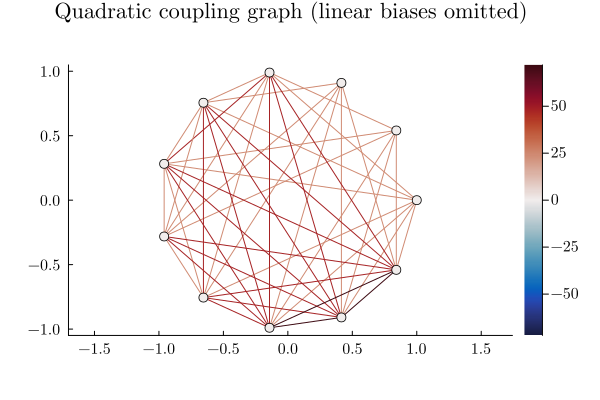

In [5]:
plot(QUBOTools.SystemLayoutPlot(J + transpose(J));
     title = "Quadratic coupling graph (linear biases omitted)")


Since the problem is relatively small (11 variables, $2^{11} = 2048$ combinations), we can afford to enumerate all the solutions.

In [6]:
set_optimizer(ising_model, QUBO.ExactSampler.Optimizer)

optimize!(ising_model)

enumeration_time = solve_time(ising_model)

@info "Enumeration took $(enumeration_time) seconds"

[ Info: Enumeration took 0.174866759 seconds


In [7]:
if !@isdefined(DWave)
    using DWave
end


In [8]:
set_optimizer(ising_model, DWave.Neal.Optimizer)

set_optimizer_attribute(ising_model, "num_reads", 1_000)

optimize!(ising_model)

ising_s = round.(Int, value.(s))

# Display solution of the problem
println(solution_summary(ising_model))
println("* s = $ising_s")

solution_summary(; result = 1, verbose = false)
├ solver_name          : D-Wave Neal Simulated Annealing Sampler
├ Termination
│ ├ termination_status : LOCALLY_SOLVED
│ ├ result_count       : 12
│ └ raw_status         : 
├ Solution (result = 1)
│ ├ primal_status        : FEASIBLE_POINT
│ ├ dual_status          : NO_SOLUTION
│ ├ objective_value      : 

5.00000e+00
│ └ dual_objective_value : 1.31950e+03
└ Work counters
  └ solve_time (sec)   : 6.61018e-01
* s = [-1, -1, -1, -1, -1, -1, -1, -1, 1, -1, -1]


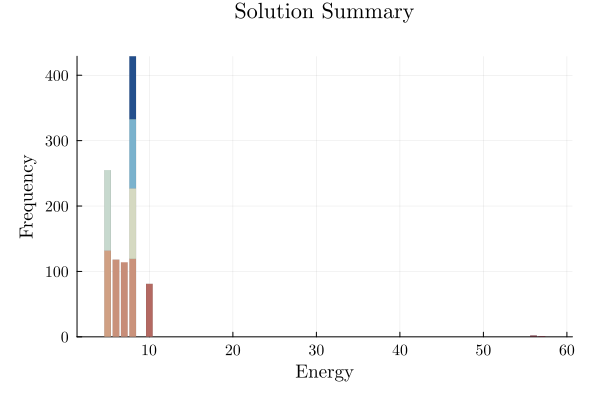

In [9]:
plot(QUBOTools.EnergyFrequencyPlot(unsafe_backend(ising_model)))

We are going to use the default limits of temperature given by the simulating annealing code. These are defined using the minimum and maximum nonzero coefficients in the Ising model. Then the range for beta is defined as 

$$
\beta \in \left[ \frac{\log(2)}{\max \{ \Delta E \} },\frac{\log(100)}{\min \{ \Delta E \} } \right]
$$

where

$$
\Delta E = \min_{i} \{h_i \} + \sum_j J_{ij}+J_{ji}
$$

Hot temperature: We want to scale hot_beta so that for the most unlikely qubit flip, we get at least 50% chance of flipping. (This means all other qubits will have > 50% chance of flipping initially). Most unlikely flip is when we go from a very low energy state to a high energy state, thus we calculate hot_beta based on max_delta_energy.

$$
0.50 = \exp(-\overline{\beta} * \max \{ \Delta E \})
$$

Cold temperature: Towards the end of the annealing schedule, we want to minimize the chance of flipping. Don't want to be stuck between small energy tweaks. Hence, set cold_beta so that at minimum energy change, the chance of flipping is set to 1%.

$$
0.01 = \exp(-\underline{\beta} * \min \{ \Delta E \})
$$

By default, the schedule also follows a geometric series.

In [10]:
function geomspace(a, b; length = 100)
    return exp10.(range(log10(a), log10(b); length))
end

geomspace (generic function with 1 method)

In [11]:
# Extract the default beta range from the solver metadata
dwave_info = QUBOTools.metadata(QUBOTools.solution(unsafe_backend(ising_model)))["dwave_info"]
β₀, β₁ = dwave_info["beta_range"]
@info "Default beta range" β₀ β₁

(2.0, 100.0)

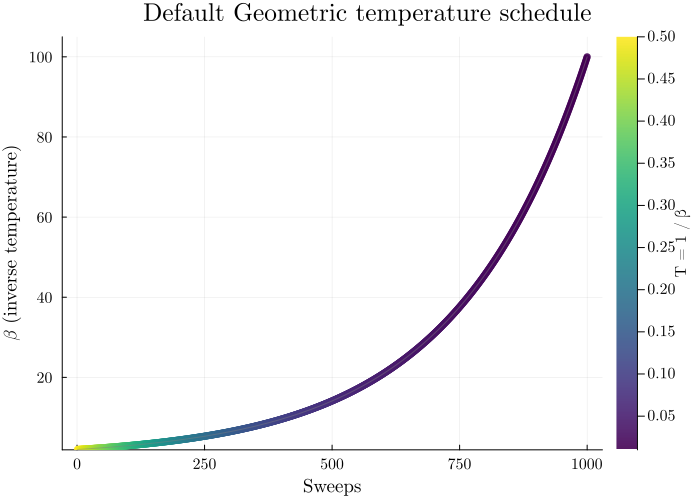

In [12]:
function schedule_values(β₀, β₁; length = 1_000)
    sweeps = collect(1:length)
    β = geomspace(β₀, β₁; length = length)
    temperature = 1.0 ./ β
    return sweeps, β, temperature
end

function plot_schedule(
    β₀,
    β₁;
    length = 1_000,
    title = "Default Geometric temperature schedule",
    plt = nothing,
    subplot = 1,
    label = nothing,
    palette = :viridis,
    show_colorbar = true,
    clims = nothing,
    markershape = :circle,
    linecolor = :gray,
)
    sweeps, β, temperature = schedule_values(β₀, β₁; length = length)

    if plt === nothing
        plt = plot(; size = (700, 500))
    end

    scatter!(
        plt,
        sweeps,
        β;
        subplot = subplot,
        marker_z = temperature,
        color = palette,
        clims = clims,
        markersize = 4,
        markershape = markershape,
        markerstrokewidth = 0,
        alpha = 0.9,
        label = something(label, ""),
        colorbar = show_colorbar,
        colorbar_title = show_colorbar ? raw"T = 1 / \beta" : nothing,
    )

    plot!(
        plt,
        sweeps,
        β;
        subplot = subplot,
        color = linecolor,
        alpha = 0.45,
        linewidth = 1,
        label = "",
    )

    plot!(
        plt;
        subplot = subplot,
        plot_title = title,
        xlabel = "Sweeps",
        ylabel = raw"$\beta$ (inverse temperature)",
        ylims = (minimum(β) * 0.95, maximum(β) * 1.05),
        legend = label === nothing ? false : :topright,
    )

    return plt
end

plot_schedule(β₀, β₁)


In [13]:
sweeps    = [1:250; 260:10:1_000]
schedules = ["geometric", "linear"]

s = 0.99 # Success probability
λ⃰ = 5.0  # Optimal Energy \lambda[tab]\asteraccent[tab]

results = Dict{Symbol,Any}(
    :p   => Dict{String,Any}(), # Success probability
    :t   => Dict{String,Any}(), # Time elapsed
    :ttt => Dict{String,Any}(), # Time-to-target
)

set_attribute(ising_model, "num_reads", 1_000)

for schedule in schedules
    results[:p][schedule]   = Float64[]
    results[:t][schedule]   = Float64[]
    results[:ttt][schedule] = Float64[]

    set_attribute(ising_model, "beta_schedule_type", schedule)

    for sweep in sweeps
        set_attribute(ising_model, "num_sweeps", sweep)

        optimize!(ising_model)

        sol = QUBOTools.solution(unsafe_backend(ising_model))
        p   = QUBOTools.success_rate(sol, λ⃰)
        t   = QUBOTools.effective_time(sol)
        if p <= 0
            ttt = Inf
        else
            p_clamped = min(p, 1 - 1E-9)
            ttt = t * log10(1 - s) / log10(1 - p_clamped + 1E-9)
        end

        push!(results[:p][schedule], p)
        push!(results[:t][schedule], t)
        push!(results[:ttt][schedule], ttt)
    end
end

results

Dict{Symbol, Any} with 3 entries:
  :p   => Dict{String, Any}("geometric"=>[0.646, 0.518, 0.43, 0.381, 0.337, 0.3…
  :ttt => Dict{String, Any}("geometric"=>[0.0357385, 0.0225816, 0.0309525, 0.03…
  :t   => Dict{String, Any}("geometric"=>[0.00805898, 0.00357865, 0.00377815, 0…

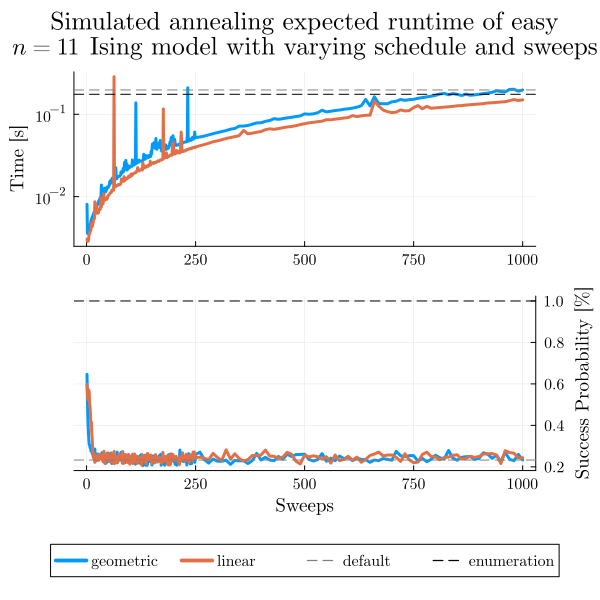

In [14]:
function plot_schedule_grid(sweeps, schedules, results)
    plt = plot(;
        layout     = @layout([a{0.475h}; b{0.475h}; leg{0.05h}]),
        size       = (600, 600),
        plot_title = raw"""
            Simulated annealing expected runtime of easy
            $ n = 11 $ Ising model with varying schedule and sweeps
            """,
        plot_titlevspan = 0.1,
    )

    # Elapsed time
    plot!(
        plt;
        subplot = 1,
        ylabel  = "Time [s]",
        yscale  = :log10,
        legend  = false,
    )

    for schedule in schedules
        plot!(
            plt, sweeps, results[:t][schedule];
            subplot   = 1,
            linestyle = :solid,
            label     = schedule,
            linewidth = 3,
        )
    end

    hline!(
        plt, [results[:t]["geometric"][end]];
        subplot   = 1,
        linestyle = :dash,
        label     = "default",
        color     = :gray,
        linewidth = 1,
    )

    hline!(
        plt, [enumeration_time];
        subplot    = 1,
        linestyle  = :dash,
        label      = "enumeration",
        color      = :black,
        linewidth  = 1,
    )

    # Success probability
    plot!(
        plt;
        subplot = 2,
        xlabel  = "Sweeps",
        ylabel  = "Success Probability [%]",
        legend  = false,
    )

    for schedule in schedules
        plot!(
            plt, sweeps, results[:p][schedule];
            subplot   = 2,
            linestyle = :solid,
            label     = schedule,
            ymirror   = true,
            linewidth = 3,
        )
    end
    
    hline!(
        plt, [results[:p]["geometric"][end]];
        subplot    = 2,
        linestyle  = :dash,
        label      = "default",
        color      = :gray,
        linewidth  = 1,
    )

    hline!(
        plt, [1.0];
        subplot    = 2,
        linestyle  = :dash,
        label      = "enumeration",
        color      = :black,
        linewidth  = 1,
    )

    # Legend
    plot!(
        plt, (1:4)';
        subplot       = 3,
        framestyle    = nothing,
        showaxis      = false,
        grid          = false,
        linestyle     = [:solid :solid :dash :dash],
        color         = [1 2 :gray :black],
        label         = ["geometric" "linear" "default" "enumeration"],
        linewidth     = [3 3 1 1],
        legend        = :top,
        legend_column = 4,
    )

    return plt
end

plot_schedule_grid(sweeps, schedules, results)

These plots represent two competing objectives: on one hand we want a high probability of success, and on the other hand we want a short runtime.
If a single run succeeds with probability $p$, then the expected number of independent runs needed to reach an overall success probability $s$ is

$$
R = \frac{\log(1-s)}{\log(1-p)}
$$

The quantity reported below is the Time To Solution (TTS), which multiplies this repetition count by the measured runtime of one annealing call:

$$
\mathrm{TTS} = R\, t_{\mathrm{run}} = t_{\mathrm{run}} \frac{\log(1-s)}{\log(1-p)}
$$

We use $s = 99\%$, and $p$ is the observed success probability for the success criterion defined in each experiment.

**Timing metric.** `DWave.jl` exposes two timing quantities via `QUBOTools`: *effective time*, which measures only the C-level sampling work inside `dwave-samplers`, and *total time*, which also includes Python interop overhead (model conversion, result parsing, etc.). We use `QUBOTools.effective_time` for TTS so that the metric reflects the intrinsic cost of the annealing algorithm rather than language-bridge overhead that varies across machines and Julia/Python versions. The cell below illustrates the difference between the two metrics.

In [ ]:
# Compare the two timing metrics for the Ising model run above
sol = QUBOTools.solution(unsafe_backend(ising_model))

t_eff   = QUBOTools.effective_time(sol)
t_total = QUBOTools.total_time(sol)

@info "Timing breakdown" effective_time=t_eff total_time=t_total overhead=(t_total - t_eff)

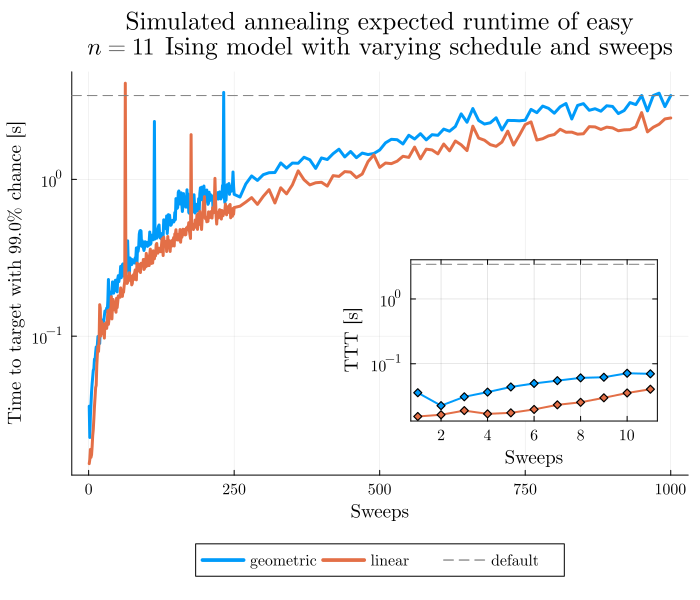

In [15]:
function plot_ttt_grid(sweeps, schedules, results; pad = 10)
    plt = plot(;
        layout     = @layout([a{0.95h}; leg{0.05h}]),
        size       = (700, 600),
        plot_title = raw"""
            Simulated annealing expected runtime of easy
            $ n = 11 $ Ising model with varying schedule and sweeps
            """,
        plot_titlevspan = 0.1,
        plot_titlefont  = Plots.font(16, "Computer Modern"),
        titlefont       = Plots.font(14, "Computer Modern"),
        guidefont       = Plots.font(12, "Computer Modern"),
        legendfont      = Plots.font(10, "Computer Modern"),
        tickfont        = Plots.font(10, "Computer Modern"),
        inset_subplots  = [(1, bbox(0.25, 0.166, 0.4, 0.4, :center))],
    )

    plot!(
        plt;
        subplot = 1,
        xlabel = "Sweeps",
        ylabel = "Time to target with \$ $(100s) \\% \$ chance [s]",
        legend = false,
    )

    for schedule in schedules
        plot!(
            plt,
            sweeps,
            results[:ttt][schedule];
            subplot = 1,
            linestyle = :solid,
            label = schedule,
            yscale = :log10,
            linewidth = 3,
        )
    end

    hline!(
        plt,
        [results[:ttt]["geometric"][end]];
        subplot = 1,
        linestyle = :dash,
        label = "default",
        color = :gray,
        linewidth = 1,
    )

    plot!(
        plt, (1:3)';
        subplot = 2,
        framestyle = nothing,
        showaxis = false,
        grid = false,
        linestyle = [:solid :solid :dash],
        linewidth = [3 3 1],
        color = [1 2 :gray],
        label = ["geometric" "linear" "default"],
        legend = :top,
        legend_column = 3,
    )

    plot!(
        plt[3];
        xlabel = "Sweeps",
        ylabel = "TTT [s]",
        yscale = :log10,
        legend = false,
        framestyle = :box,
    )

    finite_candidates = Tuple{Float64, Int}[]
    for schedule in schedules
        for (index, value) in enumerate(results[:ttt][schedule])
            if isfinite(value)
                push!(finite_candidates, (Float64(value), index))
            end
        end
    end

    _, best_candidate = findmin(first.(finite_candidates))
    center_index = finite_candidates[best_candidate][2]
    range_lo = max(1, center_index - pad)
    range_hi = min(length(sweeps), center_index + pad)
    plot_range = range_lo:range_hi

    for schedule in schedules
        plot!(
            plt[3],
            sweeps[plot_range],
            results[:ttt][schedule][plot_range];
            linewidth = 2,
            marker = :diamond,
            markersize = 4,
            label = "",
        )
    end

    hline!(
        plt[3],
        [results[:ttt]["geometric"][end]];
        linestyle = :dash,
        color = :gray,
        linewidth = 1,
        label = "",
    )

    return plt
end

plot_ttt_grid(sweeps, schedules, results)


As you can notice, the default parameters given by D-Wave (number of sweeps = $1000$ and a geometric update of $\beta$) are not optimal for our tiny example in terms of expected runtime.
This is certainly a function of the problem, for such a small instance having two sweeps are more than enough and more sweeps are an overkill.
This parameters choice might not generalize to any other problem, as seen below.

## Example 2
Let's define a larger model, with 100 variables and random weights, to see how this performance changes.

Assume that we are interested at the instance created with random weights $h_{i}, J_{i, j} \sim U[0, 1]$.

In [16]:
if !@isdefined(Random)
    using Random
end


In [17]:
# Number of variables
n = 100
const EXAMPLE2_SEED = 42

# Use a small deterministic generator so the Python and Julia
# notebooks benchmark the same random Ising instance.
const EXAMPLE2_UINT64_MASK = UInt64(0xFFFFFFFFFFFFFFFF)
const EXAMPLE2_STEP = UInt64(0xBF58476D1CE4E5B9)

function example2_splitmix64(x::UInt64)
    z = x + UInt64(0x9E3779B97F4A7C15)
    z = (z ⊻ (z >> 30)) * UInt64(0xBF58476D1CE4E5B9)
    z = (z ⊻ (z >> 27)) * UInt64(0x94D049BB133111EB)
    return z ⊻ (z >> 31)
end

function example2_uniform_values(count::Int, seed_parts...)
    state = UInt64(0x123456789ABCDEF0)
    for part in seed_parts
        state = example2_splitmix64(state ⊻ UInt64(part))
    end
    values = Vector{Float64}(undef, count)
    @inbounds for i in 1:count
        counter = state + UInt64(i - 1) * EXAMPLE2_STEP
        values[i] = Float64(example2_splitmix64(counter) >> 11) * 2.0^-53
    end
    return values
end

J = triu(permutedims(reshape(example2_uniform_values(n * n, EXAMPLE2_SEED, 0, n), n, n)), 1)
h = example2_uniform_values(n, EXAMPLE2_SEED, 1, n)

;


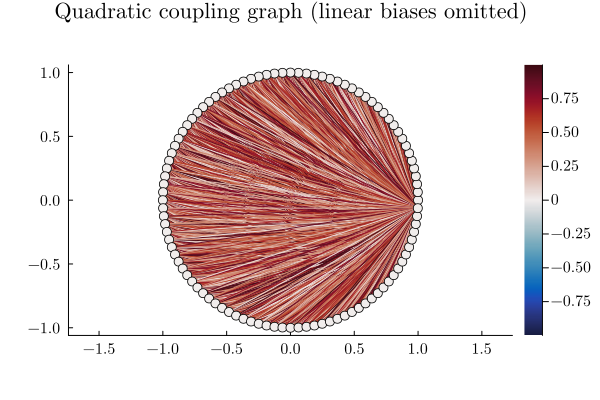

In [18]:
plot(QUBOTools.SystemLayoutPlot(J + transpose(J));
     title = "Quadratic coupling graph (linear biases omitted)")


For a problem of this size we cannot do a complete enumeration ($2^{100} \approx 1.2e30$) but we can randomly sample the distribution of energies to have a baseline for our later comparisons.

In [19]:
random_ising_model = Model()

@variable(random_ising_model, s[1:n], Spin)

@objective(random_ising_model, Min, s' * J * s + h' * s)

random_ising_model

A JuMP Model
├ solver: none
├ objective_sense: MIN_SENSE
│ └ objective_function_type: QuadExpr
├ num_variables: 100
├ num_constraints: 100
│ └ VariableRef in QUBOTools_MOI.Spin: 100
└ Names registered in the model
  └ :s

In [20]:
if !@isdefined(Statistics)
    using Statistics
end


In [21]:
set_optimizer(random_ising_model, QUBO.RandomSampler.Optimizer)
set_attribute(random_ising_model, "num_reads", 1_000)

optimize!(random_ising_model)

random_sampling_time = solve_time(random_ising_model)

energies = [objective_value(random_ising_model; result = i) for i = 1:result_count(random_ising_model)]

random_mean_energy = mean(energies)

@info "Average random energy = $(random_mean_energy)"

[ Info: Average random energy = 0.3101440042929971


In [22]:
set_optimizer(random_ising_model, DWave.Neal.Optimizer)
set_attribute(random_ising_model, "num_reads", 1_000)
set_attribute(random_ising_model, "seed", 42)

optimize!(random_ising_model)

@info "Simulated Annealing best energy = $(objective_value(random_ising_model))"

[ Info: Simulated Annealing best energy = -239.24637050611463


Notice that the minimum energy coming from the random sampling and the one from the simulated annealing are very different. 
Moreover, the distributions that both lead to are extremely different too.

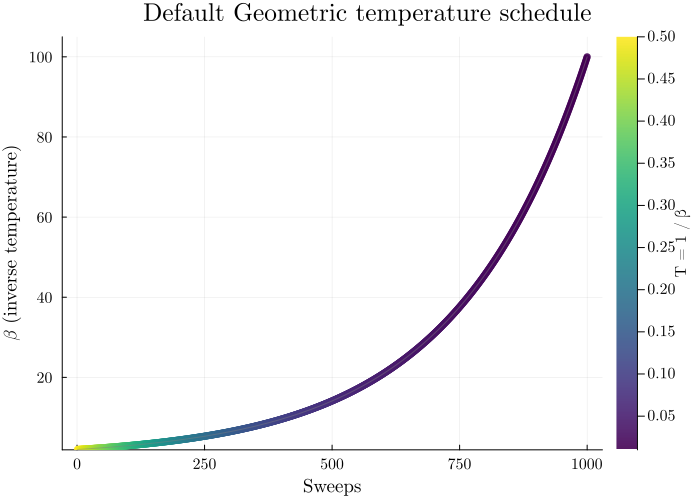

In [23]:
# Extract the default beta range from the solver metadata
dwave_info = QUBOTools.metadata(QUBOTools.solution(unsafe_backend(random_ising_model)))["dwave_info"]
β₀, β₁ = dwave_info["beta_range"]
@info "Default beta range" β₀ β₁

plot_schedule(β₀, β₁)

We can solve this problem with integer programming and certify optimality, but for this notebook we instead define success as reaching a target fraction of the best solution found during the benchmarking campaign.
To compare instances on a common scale, we define the Performance Ratio $\mathrm{PR}$ as

$$
\mathrm{PR} = \frac{E_{\mathrm{rand}} - E_{\mathrm{found}}}{E_{\mathrm{rand}} - E_{\min}}
$$

Here $E_{\mathrm{found}}$ is the best energy observed in the sample, $E_{\mathrm{rand}}$ is the mean energy from the random baseline above, and $E_{\min}$ is the best energy found during the parameter sweep.
This quantity equals $1$ at the best-known energy and can be negative when a method performs worse than the random baseline.
Success is then defined as being within a fixed threshold of this value of $1$.


Before searching for the best parameters, we first try to reuse previously computed results.
Set `overwrite_pickles = true` if you want to regenerate them instead of using cached data.


In [24]:
pickle_path = joinpath(JULIA_NOTEBOOKS_DIR, "results")

if !isdir(pickle_path)
    @warn "Results directory '$pickle_path' does not exist. We will create it."

    mkpath(pickle_path)
end


If a local `results.zip` archive is available, the next cell will unpack it.
Otherwise the notebook will generate the required benchmarking data locally when needed.


In [25]:
zip_name = joinpath(pickle_path, "results.zip")
overwrite_pickles = false

if isfile(zip_name)
    run(`unzip -o $zip_name -d $pickle_path`)
    @info("Results archive extracted to '$pickle_path'")
end

use_raw_data = any(
    startswith(name, "solutions_") && endswith(name, ".json")
    for name in readdir(pickle_path)
)


true

In [26]:
function write_bqpjson_solution(path::AbstractString, sol::S) where {S<:QUBOTools.AbstractSolution}
    metadata = try
        deepcopy(QUBOTools.metadata(sol))
    catch
        Dict{String,Any}()
    end

    json_data = Dict{String,Any}(
        "id"              => 0,
        "variable_domain" => QUBOTools._BQPJSON_VARIABLE_DOMAIN(QUBOTools.domain(sol)),
        "linear_terms"    => Dict{String,Any}[],
        "quadratic_terms" => Dict{String,Any}[],
        "variable_ids"    => collect(1:QUBOTools.dimension(sol)),
        "scale"           => 1,
        "offset"          => 0,
        "metadata"        => metadata,
        "version"         => string(QUBOTools.BQPJSON().version),
    )

    sol_id = 0
    solutions = Dict{String,Any}[]

    for sample in sol
        assignment = Dict{String,Any}[
            Dict{String,Any}("id" => i, "value" => QUBOTools.state(sample, i))
            for i in 1:QUBOTools.dimension(sol)
        ]

        evaluation = QUBOTools.value(sample)

        for _ in 1:QUBOTools.reads(sample)
            push!(
                solutions,
                Dict{String,Any}(
                    "id"         => (sol_id += 1),
                    "assignment" => assignment,
                    "evaluation" => evaluation,
                ),
            )
        end
    end

    json_data["solutions"] = solutions

    open(path, "w") do io
        JSON.print(io, json_data, QUBOTools.BQPJSON().indent)
    end

    return nothing
end

function read_bqpjson_solution(path::AbstractString)
    data = JSON.parsefile(path)
    metadata = Dict{String,Any}(get(data, "metadata", Dict{String,Any}()))
    domain = get(data, "variable_domain", "spin") == "boolean" ? :bool : :spin

    grouped_samples = Dict{Tuple{Vararg{Int}}, Tuple{Float64, Int}}()

    for sol_json in get(data, "solutions", Any[])
        assignment_list = sol_json["assignment"]
        sort!(assignment_list, by = x -> x["id"])

        state = Tuple(Int(a["value"]) for a in assignment_list)
        energy = Float64(sol_json["evaluation"])
        _, reads = get(grouped_samples, state, (energy, 0))
        grouped_samples[state] = (energy, reads + 1)
    end

    samples = QUBOTools.Sample{Float64, Int}[]
    for (state, (value, reads)) in grouped_samples
        push!(samples, QUBOTools.Sample(collect(state), value, reads))
    end

    return QUBOTools.SampleSet(samples; metadata = metadata, sense = :min, domain = domain)
end


read_bqpjson_solution (generic function with 1 method)

In [27]:
to_float_vector(values) = Float64[Float64(v) for v in values]
to_float_pair_vector(values) = [(Float64(v[1]), Float64(v[2])) for v in values]

function normalize_boot_schedule_dict(data; pair_values=false)
    Dict(
        parse(Int, boot_key) => Dict(
            schedule => (pair_values ? to_float_pair_vector(values) : to_float_vector(values))
            for (schedule, values) in schedule_dict
        )
        for (boot_key, schedule_dict) in data
    )
end

normalize_schedule_vector_dict(data) = Dict(schedule => to_float_vector(values) for (schedule, values) in data)
normalize_schedule_scalar_dict(data) = Dict(schedule => Float64(value) for (schedule, value) in data)

finite_values(values) = Float64[
    Float64(v) for v in vec(values)
    if v isa Number && isfinite(v)
]

s         = 0.99
threshold = 5.0

sweeps    = [1:250;260:10:1_000]
schedules = ["geometric"]

total_reads    = 1_000
default_sweeps = 1_000
n_boot         = 1_000
ci             = 68
default_boots  = default_sweeps

boots = [1, 10, default_boots]

min_energy = -239.7094652034834
random_energy = random_mean_energy

instance       = 42
bootstrap_seed = instance
performance_ratio_label = raw"$\mathrm{PR}=\frac{E_{\mathrm{rand}}-E_{\mathrm{found}}}{E_{\mathrm{rand}}-E_{\min}}$"
const ANNEAL_CACHE_TAG = "dwave_neal_optimizer_shared_instance_v1"
const SCHEDULE_SEED_CODES = Dict("linear" => 1, "geometric" => 2, "custom" => 3)
const SEED_TAG_RESULTS_42 = 44
const SEED_TAG_INSTANCE_42_PROFILE = 52
const SEED_TAG_ALL_RESULTS = 54
const SEED_TAG_ENSEMBLE_TTS = 57
const SEED_TAG_ENSEMBLE_PR_SWEEPS = 58
const SEED_TAG_ENSEMBLE_PR_READS = 59
const SEED_TAG_INSTANCE_42_TRANSFER_PROFILE = 62
const SEED_TAG_ENSEMBLE_TRANSFER_PROFILE = 65

# NOTEBOOK_5_BENCHMARK_HELPERS_START
use_reference_bootstrap = true
bootstrap_rng_seed = nothing

# SplitMix64 is only used to make the Julia notebook draw the same
# bootstrap samples as the Python notebook when we want a direct
# comparison. Set `use_reference_bootstrap = false` to use ordinary
# pseudo-random resampling instead.
const SPLITMIX_INCREMENT = UInt64(0x9E3779B97F4A7C15)
const BOOTSTRAP_BOOT_STEP = UInt64(0x9E3779B97F4A7C15)
const BOOTSTRAP_DRAW_STEP = UInt64(0xBF58476D1CE4E5B9)
const SPLITMIX_MULTIPLIER_1 = UInt64(0xBF58476D1CE4E5B9)
const SPLITMIX_MULTIPLIER_2 = UInt64(0x94D049BB133111EB)

function splitmix64(x::UInt64)
    z = x + SPLITMIX_INCREMENT
    z = (z ⊻ (z >> 30)) * SPLITMIX_MULTIPLIER_1
    z = (z ⊻ (z >> 27)) * SPLITMIX_MULTIPLIER_2
    return z ⊻ (z >> 31)
end

function bootstrap_context_seed(parts...)
    state = UInt64(0x123456789ABCDEF0)
    for part in parts
        state = splitmix64(state ⊻ UInt64(part))
    end
    return state
end

schedule_seed_code(schedule) = get(SCHEDULE_SEED_CODES, String(schedule), 0)

anneal_seed(parts...) = Int(mod(bootstrap_context_seed(parts...), UInt64(2_147_483_646))) + 1

function bootstrap_indices(sample_count::Int, draw_count::Int, n_boot::Int, seed_parts...)
    sample_count > 0 || throw(ArgumentError("sample_count must be positive"))
    draw_count > 0 || throw(ArgumentError("draw_count must be positive"))
    n_boot > 0 || throw(ArgumentError("n_boot must be positive"))

    if use_reference_bootstrap
        base = bootstrap_context_seed(seed_parts...)
        indices = Matrix{Int}(undef, n_boot, draw_count)
        @inbounds for i in 1:n_boot
            boot_offset = UInt64(i - 1) * BOOTSTRAP_BOOT_STEP
            for j in 1:draw_count
                counter = base + boot_offset + UInt64(j - 1) * BOOTSTRAP_DRAW_STEP
                indices[i, j] = Int(mod(splitmix64(counter), UInt64(sample_count))) + 1
            end
        end
        return indices
    end

    rng = isnothing(bootstrap_rng_seed) ? Random.default_rng() : MersenneTwister(Int(bootstrap_rng_seed))
    return rand(rng, 1:sample_count, n_boot, draw_count)
end

function percentile_interval(values; ci=68)
    finite = finite_values(values)
    isempty(finite) && return (NaN, NaN)
    return (
        percentile(finite, 50.0 - ci / 2.0),
        percentile(finite, 50.0 + ci / 2.0),
    )
end

performance_ratio(energy, random_energy, min_energy) = (Float64(random_energy) - Float64(energy)) / (Float64(random_energy) - Float64(min_energy))

function performance_ratio_interval(bounds, random_energy, min_energy)
    ratios = [performance_ratio(bound, random_energy, min_energy) for bound in bounds]
    return (minimum(ratios), maximum(ratios))
end

function bootstrap_minima(energies::AbstractVector, shot_count::Int, n_boot::Int, seed_parts...)
    resampler = bootstrap_indices(length(energies), shot_count, n_boot, seed_parts...)
    boot_dist = Vector{Float64}(undef, n_boot)
    @inbounds for i in 1:n_boot
        boot_dist[i] = minimum(energies[resampler[i, :]])
    end
    return boot_dist
end

function time_to_target(runtime_s, success_probability, target_success)
    clipped_probability = clamp(Float64(success_probability), 1e-9, 1.0 - 1e-9)
    return runtime_s * log10(1.0 - target_success) / log10(1.0 - clipped_probability)
end

function summarize_bootstrap_quality(
    energies,
    occurrences,
    boot_sizes;
    n_boot,
    ci,
    random_energy,
    min_energy,
    success_energy,
    runtime_s,
    target_success,
    seed_parts=(),
)
    summary = Dict{Int, Any}()

    for boot in boot_sizes
        resampler = bootstrap_indices(length(energies), boot, n_boot, seed_parts..., boot)
        boot_minima = Float64[]
        success_rates = Float64[]

        for row in eachrow(resampler)
            sample_boot = energies[row]
            push!(boot_minima, minimum(sample_boot))

            occurrences_boot = occurrences[row]
            counts = Dict{Float64, Int}()
            for (index, energy) in enumerate(sample_boot)
                counts[energy] = get(counts, energy, 0) + occurrences_boot[index]
            end
            push!(success_rates, sum(count for (energy, count) in counts if energy < success_energy) / boot)
        end

        best_ci = percentile_interval(boot_minima; ci=ci)
        success_rate = mean(success_rates)

        if !all(x -> x > 0, success_rates)
            ttt_value = Inf
            ttt_ci = (Inf, Inf)
        else
            success_ci = percentile_interval(success_rates; ci=ci)
            ttt_value = time_to_target(runtime_s, success_rate, target_success)
            ttt_bounds = sort([
                time_to_target(runtime_s, success_ci[1], target_success),
                time_to_target(runtime_s, success_ci[2], target_success),
            ])
            ttt_ci = (ttt_bounds[1], ttt_bounds[2])
        end

        summary[boot] = Dict(
            :probability => success_rate,
            :ttt => ttt_value,
            :ttt_ci => ttt_ci,
            :best_energy => mean(boot_minima),
            :best_energy_ci => best_ci,
            :performance_ratio => performance_ratio(mean(boot_minima), random_energy, min_energy),
            :performance_ratio_ci => performance_ratio_interval(best_ci, random_energy, min_energy),
        )
    end

    return summary
end

function build_performance_ratio_profile(energies, draw_counts; n_boot, random_energy, min_energy, ci=68, seed_parts=())
    ratios = Float64[]
    ratio_intervals = Tuple{Float64, Float64}[]

    for draw_count in draw_counts
        boot_dist = bootstrap_minima(energies, Int(draw_count), n_boot, seed_parts..., Int(draw_count))
        push!(ratios, performance_ratio(mean(boot_dist), random_energy, min_energy))
        push!(ratio_intervals, performance_ratio_interval(percentile_interval(boot_dist; ci=ci), random_energy, min_energy))
    end

    return ratios, ratio_intervals
end

function deterministic_uniform_values(count::Int, seed_parts...)
    base = bootstrap_context_seed(seed_parts...)
    values = Vector{Float64}(undef, count)
    @inbounds for i in 1:count
        state = splitmix64(base + UInt64(i - 1) * BOOTSTRAP_DRAW_STEP)
        values[i] = Float64(state >> 11) * 2.0^-53
    end
    return values
end

function build_random_ising_instance(instance_seed, n)
    J_values = deterministic_uniform_values(n * n, instance_seed, 0, n)
    J_instance = triu(permutedims(reshape(J_values, n, n)), 1)
    h_instance = deterministic_uniform_values(n, instance_seed, 1, n)
    instance_model = Model()
    @variable(instance_model, s_inst[1:n], Spin)
    @objective(instance_model, Min, s_inst' * J_instance * s_inst + h_instance' * s_inst)
    return J_instance, h_instance, instance_model
end

solution_energies(sol) = hasproperty(sol, :energies) ? Float64[Float64(v) for v in sol.energies] : Float64.(QUBOTools.value.(sol))
solution_occurrences(sol) = hasproperty(sol, :occurrences) ? Int[Int(v) for v in sol.occurrences] : Int.(QUBOTools.reads.(sol))

function neal_sample_ising(instance_model, schedule, sweep, seed)
    set_optimizer(instance_model, DWave.Neal.Optimizer)
    set_attribute(instance_model, "num_reads", total_reads)
    set_attribute(instance_model, "num_sweeps", sweep)
    set_attribute(instance_model, "beta_schedule_type", schedule)
    set_attribute(instance_model, "seed", seed)

    start_time = time()
    optimize!(instance_model)
    time_s = time() - start_time
    sol = QUBOTools.solution(unsafe_backend(instance_model))
    return (
        energies = solution_energies(sol),
        occurrences = solution_occurrences(sol),
    ), time_s
end

function load_or_generate_solution(instance_model, instance_seed, schedule, sweep; overwrite_pickles=false)
    solution_name = joinpath(pickle_path, "solutions_$(instance_seed)_$(schedule)_$(sweep)_$(ANNEAL_CACHE_TAG).json")

    local sol
    local time_s
    if isfile(solution_name) && !overwrite_pickles
        cache = JSON.parsefile(solution_name)
        sol = (
            energies = to_float_vector(cache["energies"]),
            occurrences = Int[Int(v) for v in cache["occurrences"]],
        )
        time_s = Float64(cache["time_s"])
    else
        sol, time_s = neal_sample_ising(
            instance_model,
            schedule,
            sweep,
            anneal_seed(instance_seed, schedule_seed_code(schedule), sweep, total_reads),
        )
        open(solution_name, "w") do io
            JSON.print(io, Dict(
                "energies" => sol.energies,
                "occurrences" => sol.occurrences,
                "time_s" => time_s,
            ))
        end
    end

    return sol, time_s
end

function expand_solution_energies(sol)
    energies_unique = solution_energies(sol)
    occurrences = solution_occurrences(sol)
    return vcat([fill(energies_unique[i], occurrences[i]) for i in 1:length(energies_unique)]...)
end

function zoom_window_from_series(series...; pad=5)
    candidate_indices = Int[]
    max_length = 0
    for values in series
        array = [(v isa Number && isfinite(v)) ? Float64(v) : NaN for v in values]
        max_length = max(max_length, length(array))
        finite_idx = findall(isfinite, array)
        if !isempty(finite_idx)
            push!(candidate_indices, argmin(replace(array, NaN => Inf)))
        end
    end
    isempty(candidate_indices) && return 1:max_length
    range_lo = max(1, minimum(candidate_indices) - pad)
    range_hi = min(max_length, maximum(candidate_indices) + pad)
    return range_lo:range_hi
end
# NOTEBOOK_5_BENCHMARK_HELPERS_END

results_name = "results_$(instance).json"
results_name = joinpath(pickle_path, results_name)
results = Dict{Symbol,Any}(
    :p             => Dict{Int,Any}(),
    :min_energy    => Dict{String,Any}(),
    :random_energy => Dict{String,Any}(),
    :ttt           => Dict{Int,Any}(),
    :tttci         => Dict{Int,Any}(),
    :t             => Dict{String,Any}(),
    :best          => Dict{Int,Any}(),
    :bestci        => Dict{Int,Any}(),
)

if overwrite_pickles || !isfile(results_name)
    overwrite_pickles = false

    for boot in boots
        results[:p][boot]      = Dict()
        results[:ttt][boot]    = Dict()
        results[:tttci][boot]  = Dict()
        results[:best][boot]   = Dict()
        results[:bestci][boot] = Dict()
    end

    for schedule in schedules
        probs       = Dict{Int,Any}(k => [] for k in boots)
        time_to_sol = Dict{Int,Any}(k => [] for k in boots)
        tttcs       = Dict{Int,Any}(k => [] for k in boots)
        times       = Float64[]
        best_values = Dict{Int,Any}(k => [] for k in boots)
        best_ci     = Dict{Int,Any}(k => [] for k in boots)

        for sweep in sweeps
            sol, time_s = load_or_generate_solution(random_ising_model, instance, schedule, sweep; overwrite_pickles=overwrite_pickles)
            energies = solution_energies(sol)
            occurrences = solution_occurrences(sol)

            push!(times, time_s)

            current_min_energy = minimum(energies)
            if current_min_energy < min_energy
                min_energy = current_min_energy
                @info("A better solution of '$(min_energy)' was found for sweep '$sweep'")
            end

            success = random_energy - (random_energy - min_energy) * (1.0 - threshold / 100.0)
            summary = summarize_bootstrap_quality(
                energies,
                occurrences,
                boots;
                n_boot=n_boot,
                ci=ci,
                random_energy=random_energy,
                min_energy=min_energy,
                success_energy=success,
                runtime_s=time_s,
                target_success=s,
                seed_parts=(bootstrap_seed, SEED_TAG_RESULTS_42, sweep),
            )

            for boot in boots
                push!(probs[boot], summary[boot][:probability])
                push!(time_to_sol[boot], summary[boot][:ttt])
                push!(tttcs[boot], summary[boot][:ttt_ci])
                push!(best_values[boot], summary[boot][:performance_ratio])
                push!(best_ci[boot], summary[boot][:performance_ratio_ci])
            end
        end

        results[:t][schedule]             = times
        results[:min_energy][schedule]    = min_energy
        results[:random_energy][schedule] = random_energy

        for boot in boots
            results[:p][boot][schedule]     = probs[boot]
            results[:ttt][boot][schedule]   = time_to_sol[boot]
            results[:tttci][boot][schedule] = tttcs[boot]
            results[:best][boot][schedule]  = best_values[boot]
            results[:bestci][boot][schedule] = best_ci[boot]
        end
    end

    open(results_name, "w") do io
        JSON.print(io, results)
    end
else
    string_dict = JSON.parsefile(results_name)

    results = Dict{Symbol, Any}()
    key_aliases = Dict(:tts => :ttt, :ttsci => :tttci)

    for (k_str, v) in string_dict
        k_sym = get(key_aliases, Symbol(k_str), Symbol(k_str))
        if k_sym in (:p, :ttt, :best)
            results[k_sym] = normalize_boot_schedule_dict(v)
        elseif k_sym in (:tttci, :bestci)
            results[k_sym] = normalize_boot_schedule_dict(v; pair_values=true)
        elseif k_sym == :t
            results[k_sym] = normalize_schedule_vector_dict(v)
        elseif k_sym in (:min_energy, :random_energy)
            results[k_sym] = normalize_schedule_scalar_dict(v)
        else
            results[k_sym] = v
        end
    end
end


After gathering all the results, we would like to see how the Performance Ratio evolves as we increase the number of sweeps.
To account for the stochasticity of this method, we bootstrap the best energy reached at each sample size and report central bootstrap percentile intervals.
The helper functions above default to a deterministic SplitMix64 resampler so the Julia and Python notebooks use identical bootstrap draws when we compare them directly.
Set `use_reference_bootstrap = false` if you prefer standard pseudo-random resampling instead.


In [28]:
function plot_progress(sweeps, boots, schedules, results)
    plt = plot(;
        plot_title = """
            Simulated annealing Performance Ratio of Ising 42 N=100
            with varying schedule, $(n_boot) bootstrap re-samples, and sweeps
            """,
        xscale     = :log10,
        xticks     = 10.0.^(0:3),
        ylims      = (0.8, 1.01),
        xlabel     = "Sweeps",
        ylabel     = performance_ratio_label,
        legend     = :outertop,
    )

    for boot in boots
        for schedule in schedules
            bestnp = transpose(stack(results[:bestci][boot][schedule], dims=1))

            plot!(
                plt,
                sweeps, bestnp[1, :];
                fillrange = bestnp[2, :],
                fillalpha = 0.25,
            )

            plot!(
                plt,
                sweeps, results[:best][boot][schedule];
                label = "$schedule, $boot reads",
            )
        end
    end
end


plot_progress (generic function with 1 method)

In [29]:
plot_progress(sweeps, boots, schedules, results)

Now, besides looking at the sweeps, which are our parameter, we want to see how the performance changes with respect to the number of shots, which in this case are proportional to the computational time/effort that it takes to solve the problem.

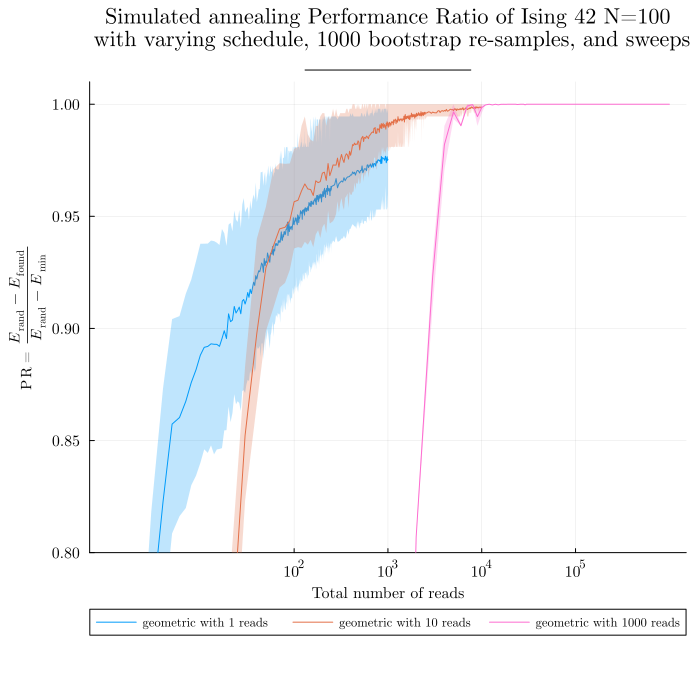

In [30]:
# 1. Define labels and title
title_str = "Simulated annealing Performance Ratio of Ising 42 N=100\n with varying schedule, $n_boot bootstrap re-samples, and sweeps"
ylabel_str = performance_ratio_label
xlabel_str = "Total number of reads"

# 2. Create an empty plot object
p = plot()

# 3. Loop and add all your data to 'p'
for boot in boots
    reads = [s * boot for s in sweeps]
    for schedule in schedules
        label_str = "$schedule with $boot reads"
        
        mean_line = results[:best][boot][schedule]
        ci_data = results[:bestci][boot][schedule]
        low_bound = getindex.(ci_data, 1)
        high_bound = getindex.(ci_data, 2)

        # Plot directly to 'p'
        plot!(p, reads, mean_line, 
              ribbon=(mean_line .- low_bound, high_bound .- mean_line),
              fillalpha=0.25,
              label=label_str)
    end
end

# 4. Apply all formatting to 'p' at the very end
plot!(p,
    # --- Size and Spacing (to fix cramping) ---
    size = (700, 700),
    plot_titlevspan = 0.1,      # Adds padding for the title
    
    # --- Labels and Title ---
    plot_title = title_str,
    xlabel = xlabel_str,
    ylabel = ylabel_str,
    
    # --- Axes ---
    xscale = :log10,
    xticks = 10.0.^(2:5),  # Explicit ticks for log scale to avoid warnings
    ylims = (0.8, 1.01),

    # --- Legend (This is the fix) ---
    legend = :outerbottom,      # Move legend outside, to the bottom
    legend_columns = 3,
    
    # --- Fonts ---
    plot_titlefont  = Plots.font(14, "Computer Modern"),
    guidefont       = Plots.font(10, "Computer Modern"),
    legendfont      = Plots.font(8, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

# 5. Display the final plot
display(p)

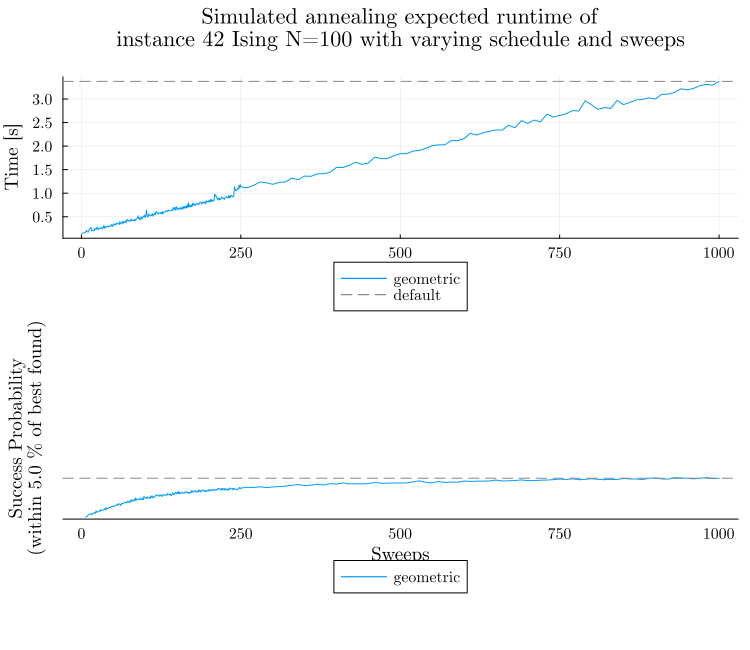

In [31]:
p1 = plot()
p2 = plot(yscale=:log10, yticks=10.0.^(-3:1))

title_str = "Simulated annealing expected runtime of\ninstance $instance Ising N=100 with varying schedule and sweeps"

for schedule in schedules
    plot!(p1, sweeps, results[:t][schedule], label=schedule)
end

hline!(p1, [results[:t]["geometric"][end]], linestyle=:dash, label="default", color=:blue)
ylabel!(p1, "Time [s]")

for schedule in schedules
    plot!(p2, sweeps, results[:p][default_sweeps][schedule], label=schedule)
end

hline!(p2, [results[:p][default_sweeps]["geometric"][end]], linestyle=:dash, label="", color=:blue)
ylabel!(p2, "Success Probability\n(within $threshold % of best found)")
xlabel!(p2, "Sweeps")

p_final = plot(
    p1,
    p2,
    layout = (2, 1),
    plot_title = title_str,
    size = (750, 650),
    plot_titlevspan = 0.1,
    legend = :outerbottom,
    legend_columns = 1,
    plot_titlefont  = Plots.font(14, "Computer Modern"),
    titlefont       = Plots.font(14, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern"),
)

display(p_final)


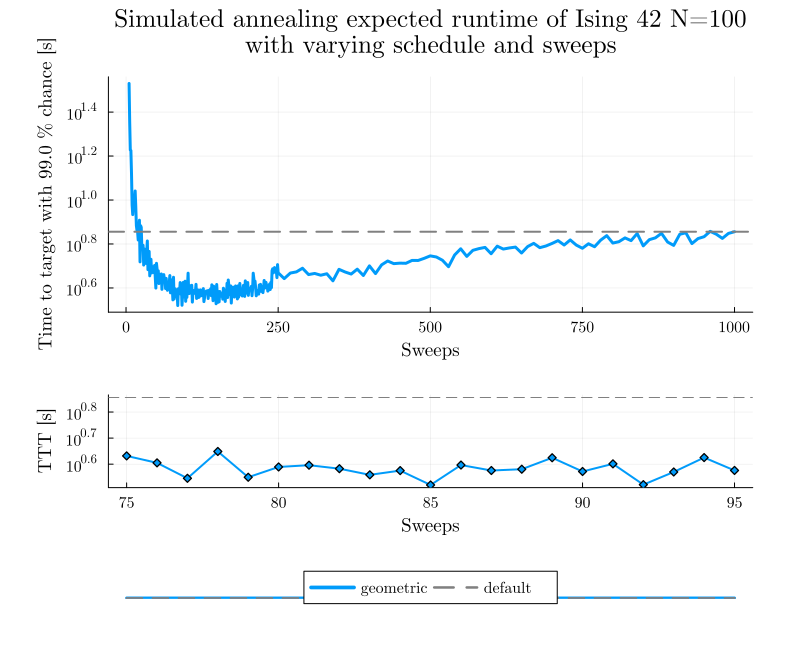

In [32]:
clean_ttt(values) = [
    (v isa Number && isfinite(v)) ? Float64(v) : NaN
    for v in values
]

function plot_ttt_grid_adapted(sweeps, schedules, results;
                        main_boot,
                        inset_boot,
                        main_hline_boot,
                        inset_hline_boot,
                        pad = 10,
                        success_probability = s)

    plt = plot(;
        layout     = @layout([a{0.66h}; b{0.26h}; leg{0.08h}]),
        size       = (800, 650),
        left_margin   = 10mm,
        bottom_margin = 5mm,
        right_margin  = 10mm,
        plot_title = "Simulated annealing expected runtime of Ising 42 N=100\nwith varying schedule and sweeps",
        plot_titlevspan = 0.1,
        plot_titlefont  = Plots.font(16, "Computer Modern"),
        titlefont       = Plots.font(14, "Computer Modern"),
        guidefont       = Plots.font(12, "Computer Modern"),
        legendfont      = Plots.font(10, "Computer Modern"),
        tickfont        = Plots.font(10, "Computer Modern"),
    )

    plot!(
        plt;
        subplot = 1,
        xlabel  = "Sweeps",
        ylabel  = "Time to target with $(100 * success_probability) % chance [s]",
        legend  = false,
        yscale  = :log10,
    )

    inset_series = Vector{Vector{Float64}}()
    for (i, schedule) in enumerate(schedules)
        main_data = clean_ttt(results[:ttt][main_boot][schedule])
        inset_data = clean_ttt(results[:ttt][inset_boot][schedule])
        push!(inset_series, inset_data)

        plot!(
            plt, sweeps, main_data;
            subplot   = 1,
            linestyle = :solid,
            label     = schedule,
            linewidth = 3,
            color     = i,
        )
    end

    default_value = results[:ttt][main_hline_boot]["geometric"][end]
    if default_value isa Number && isfinite(default_value)
        hline!(
            plt, [default_value];
            subplot    = 1,
            linestyle  = :dash,
            label      = "default",
            color      = :gray,
            linewidth  = 2,
        )
    end

    plot!(
        plt;
        subplot = 2,
        xlabel  = "Sweeps",
        ylabel  = "TTT [s]",
        yscale  = :log10,
        legend  = false,
    )

    plot_range = zoom_window_from_series(inset_series...; pad=pad)
    for (i, series) in enumerate(inset_series)
        plot!(
            plt, sweeps[plot_range], series[plot_range];
            subplot    = 2,
            linewidth  = 2,
            marker     = :diamond,
            markersize = 4,
            color      = i,
            label      = "",
        )
    end

    inset_default = results[:ttt][inset_hline_boot]["geometric"][end]
    if inset_default isa Number && isfinite(inset_default)
        hline!(
            plt, [inset_default];
            subplot   = 2,
            linestyle = :dash,
            color     = :gray,
            linewidth = 1,
            label     = "",
        )
    end

    plot!(
        plt[3];
        framestyle = :none,
        showaxis   = false,
        grid       = false,
        legend     = :top,
        legend_column = length(schedules) + 1,
    )

    for (i, schedule) in enumerate(schedules)
        plot!(plt[3], [0.0, 1.0], [0.0, 0.0]; color = i, linewidth = 3, label = schedule)
    end
    plot!(plt[3], [0.0, 1.0], [0.0, 0.0]; color = :gray, linestyle = :dash, linewidth = 2, label = "default")

    return plt
end

p_final = plot_ttt_grid_adapted(
    sweeps,
    schedules,
    results;
    main_boot = total_reads,
    inset_boot = default_sweeps,
    main_hline_boot = total_reads,
    inset_hline_boot = default_sweeps,
)

display(p_final)


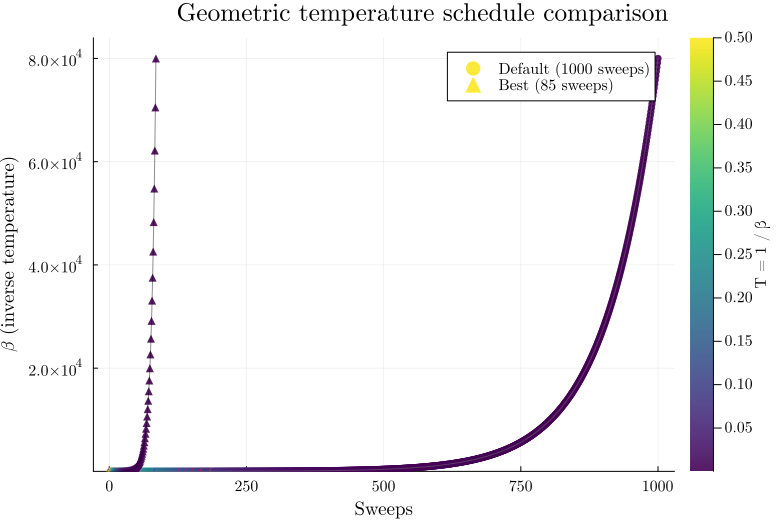

In [33]:
# Reuse the beta range extracted from the solver after cell 39
ttt_for_schedule = [
    (v isa Number && isfinite(v)) ? Float64(v) : Inf
    for v in results[:ttt][default_sweeps]["geometric"]
]
_, best_index = findmin(ttt_for_schedule)
best_sweep = sweeps[best_index]
_, _, default_temperature = schedule_values(β₀, β₁; length=default_sweeps)
_, _, best_temperature = schedule_values(β₀, β₁; length=best_sweep)
shared_clims = (
    min(minimum(default_temperature), minimum(best_temperature)),
    max(maximum(default_temperature), maximum(best_temperature)),
)

schedule_comparison = plot(size=(780, 520))
plot_schedule(
    β₀,
    β₁;
    length=default_sweeps,
    title="Geometric temperature schedule comparison",
    plt=schedule_comparison,
    label="Default ($(default_sweeps) sweeps)",
    show_colorbar=false,
    clims=shared_clims,
    markershape=:circle,
    linecolor=:gray,
)
plot_schedule(
    β₀,
    β₁;
    length=best_sweep,
    title="Geometric temperature schedule comparison",
    plt=schedule_comparison,
    label="Best ($(best_sweep) sweeps)",
    show_colorbar=true,
    clims=shared_clims,
    markershape=:utriangle,
    linecolor=:black,
)
display(schedule_comparison)


Calculating optimal sweep...
Minimum TTS for 'geometric' schedule = 3.3120138340301897s at sweep = 85
Processing sweep 85 for schedule geometric...


Processing sweep 1000 for schedule geometric...


Processing sweep 10 for schedule geometric...


Processing sweep 500 for schedule geometric...


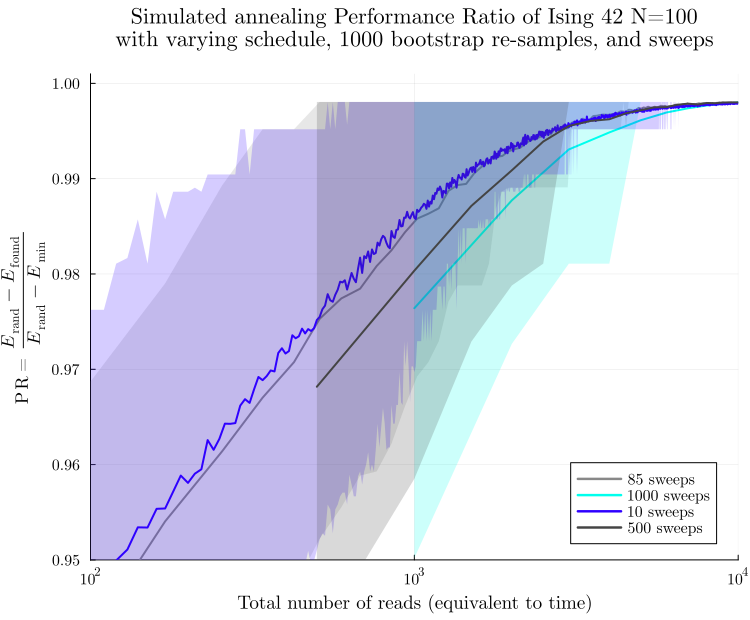

In [34]:
println("Calculating optimal sweep...")
local min_sweep

schedule_for_min_sweep = "geometric"
ttt_data = results[:ttt][default_sweeps][schedule_for_min_sweep]
finite_ttt_data = [
    (t isa Number && isfinite(t)) ? Float64(t) : Inf
    for t in ttt_data
]
min_ttt, min_index = findmin(finite_ttt_data)
min_sweep = sweeps[min_index]

println("Minimum TTS for '$schedule_for_min_sweep' schedule = $(min_ttt)s at sweep = $(min_sweep)")

interest_sweeps = unique([min_sweep, default_sweeps, 10, 500])
n_boot_plot = 1000
boot_range = collect(1:(total_reads - 1))

approx_ratio = Dict{String, Dict{Int, Vector{Float64}}}()
approx_ratioci = Dict{String, Dict{Int, Vector{Tuple{Float64, Float64}}}}()
profile_colors = Dict(sweep => color for (sweep, color) in zip(interest_sweeps, [:blue, :orange, :green, :purple]))

p_approx = plot()

for schedule in ["geometric"]
    approx_ratio[schedule] = Dict{Int, Vector{Float64}}()
    approx_ratioci[schedule] = Dict{Int, Vector{Tuple{Float64, Float64}}}()

    schedule_min_energy = results[:min_energy][schedule]
    schedule_random_energy = results[:random_energy][schedule]

    for sweep in interest_sweeps
        println("Processing sweep $sweep for schedule $schedule...")
        sol, _ = load_or_generate_solution(random_ising_model, instance, schedule, sweep; overwrite_pickles=overwrite_pickles)
        all_energies = expand_solution_energies(sol)

        schedule_min_energy = min(schedule_min_energy, minimum(all_energies))
        ratios, ratio_ci = build_performance_ratio_profile(
            all_energies,
            boot_range;
            n_boot=n_boot_plot,
            random_energy=schedule_random_energy,
            min_energy=schedule_min_energy,
            ci=ci,
            seed_parts=(bootstrap_seed, SEED_TAG_INSTANCE_42_PROFILE, sweep),
        )

        approx_ratio[schedule][sweep] = ratios
        approx_ratioci[schedule][sweep] = ratio_ci

        x_values = [shot * sweep for shot in boot_range]
        lower_bound_series = first.(ratio_ci)
        upper_bound_series = last.(ratio_ci)

        ribbon_low = ratios .- lower_bound_series
        ribbon_high = upper_bound_series .- ratios

        plot!(
            p_approx,
            x_values,
            ratios;
            label="$sweep sweeps",
            linewidth=2,
            color=profile_colors[sweep],
            ribbon=(ribbon_low, ribbon_high),
            fillalpha=0.2,
        )
    end
end

plot!(
    p_approx,
    plot_title = "Simulated annealing Performance Ratio of Ising 42 N=100\nwith varying schedule, $n_boot_plot bootstrap re-samples, and sweeps",
    xlabel = "Total number of reads (equivalent to time)",
    ylabel = performance_ratio_label,
    xscale = :log10,
    xticks = 10.0.^(2:4),
    ylims = (0.95, 1.001),
    xlims = (1e2, 1e4),
    legend = :best,
    size = (750, 620),
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(14, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

display(p_approx)


Here we see how using the optimal number of sweeps improves performance relative to other values, including the solver default.
Of course, we only know that after running the full experiment on this specific instance.
In practice, we instead ask how well parameters chosen from similar, but not identical, instances transfer.
To study that, we generate 20 random instances with the same size and distribution but different random seeds.


In [35]:
println("Starting multi-instance analysis...")

instances = 0:19
schedules_multi = ["geometric"]
all_results = Dict{Int, Any}()
all_results_name = joinpath(pickle_path, "all_results.json")

if isfile(all_results_name) && !overwrite_pickles
    println("Loading cached multi-instance results from $all_results_name...")
    string_dict = JSON.parsefile(all_results_name)
    key_aliases = Dict(:tts => :ttt, :ttsci => :tttci)

    for (instance_str, instance_data) in string_dict
        converted_instance_data = Dict{Symbol, Any}()

        for (key_str, value) in instance_data
            key_sym = get(key_aliases, Symbol(key_str), Symbol(key_str))

            if key_sym in (:p, :ttt, :best)
                converted_instance_data[key_sym] = normalize_boot_schedule_dict(value)
            elseif key_sym in (:tttci, :bestci)
                converted_instance_data[key_sym] = normalize_boot_schedule_dict(value; pair_values=true)
            elseif key_sym == :t
                converted_instance_data[key_sym] = normalize_schedule_vector_dict(value)
            elseif key_sym in (:min_energy, :random_energy)
                converted_instance_data[key_sym] = normalize_schedule_scalar_dict(value)
            else
                converted_instance_data[key_sym] = value
            end
        end

        all_results[parse(Int, instance_str)] = converted_instance_data
    end
else
    println("Generating multi-instance results...")

    for instance in instances
        println("--- Processing Instance $instance ---")

        all_results[instance] = Dict{Symbol, Any}(
            :p             => Dict{Int,Any}(),
            :min_energy    => Dict{String,Any}(),
            :random_energy => Dict{String,Any}(),
            :ttt           => Dict{Int,Any}(),
            :tttci         => Dict{Int,Any}(),
            :t             => Dict{String,Any}(),
            :best          => Dict{Int,Any}(),
            :bestci        => Dict{Int,Any}(),
        )

        _, _, instance_model = build_random_ising_instance(instance, n)

        set_optimizer(instance_model, QUBO.RandomSampler.Optimizer)
        set_attribute(instance_model, "num_reads", total_reads)
        optimize!(instance_model)

        instance_energies = [objective_value(instance_model; result = i) for i = 1:result_count(instance_model)]
        instance_random_energy = mean(instance_energies)

        default_sol, _ = load_or_generate_solution(instance_model, instance, "geometric", default_sweeps; overwrite_pickles=overwrite_pickles)
        instance_min_energy = minimum(solution_energies(default_sol))

        for schedule in schedules_multi
            probs       = Dict{Int,Any}(k => [] for k in boots)
            time_to_sol = Dict{Int,Any}(k => [] for k in boots)
            tttcs       = Dict{Int,Any}(k => [] for k in boots)
            times       = Float64[]
            best_values = Dict{Int,Any}(k => [] for k in boots)
            best_ci     = Dict{Int,Any}(k => [] for k in boots)
            current_min_energy = instance_min_energy

            set_optimizer(instance_model, DWave.Neal.Optimizer)

            for sweep in sweeps
                sol, time_s = load_or_generate_solution(instance_model, instance, schedule, sweep; overwrite_pickles=overwrite_pickles)
                energies = solution_energies(sol)
                occurrences = solution_occurrences(sol)

                push!(times, time_s)
                current_min_energy = min(current_min_energy, minimum(energies))
                success = instance_random_energy - (instance_random_energy - current_min_energy) * (1.0 - threshold / 100.0)

                summary = summarize_bootstrap_quality(
                    energies,
                    occurrences,
                    boots;
                    n_boot=n_boot,
                    ci=ci,
                    random_energy=instance_random_energy,
                    min_energy=current_min_energy,
                    success_energy=success,
                    runtime_s=time_s,
                    target_success=s,
                    seed_parts=(bootstrap_seed, SEED_TAG_ALL_RESULTS, instance, sweep),
                )

                for boot in boots
                    push!(probs[boot], summary[boot][:probability])
                    push!(time_to_sol[boot], summary[boot][:ttt])
                    push!(tttcs[boot], summary[boot][:ttt_ci])
                    push!(best_values[boot], summary[boot][:performance_ratio])
                    push!(best_ci[boot], summary[boot][:performance_ratio_ci])
                end
            end

            all_results[instance][:t][schedule] = times
            all_results[instance][:min_energy][schedule] = current_min_energy
            all_results[instance][:random_energy][schedule] = instance_random_energy
            for boot in boots
                all_results[instance][:p][boot] = get(all_results[instance][:p], boot, Dict{String,Any}())
                all_results[instance][:ttt][boot] = get(all_results[instance][:ttt], boot, Dict{String,Any}())
                all_results[instance][:tttci][boot] = get(all_results[instance][:tttci], boot, Dict{String,Any}())
                all_results[instance][:best][boot] = get(all_results[instance][:best], boot, Dict{String,Any}())
                all_results[instance][:bestci][boot] = get(all_results[instance][:bestci], boot, Dict{String,Any}())
                all_results[instance][:p][boot][schedule] = probs[boot]
                all_results[instance][:ttt][boot][schedule] = time_to_sol[boot]
                all_results[instance][:tttci][boot][schedule] = tttcs[boot]
                all_results[instance][:best][boot][schedule] = best_values[boot]
                all_results[instance][:bestci][boot][schedule] = best_ci[boot]
            end
        end
    end

    open(all_results_name, "w") do io
        JSON.print(io, all_results)
    end
end


Starting multi-instance analysis...
Loading cached multi-instance results from /home/bernalde/repos/QuIP/notebooks_jl/results/all_results.json...


In [36]:
"""
Calculates the median of an array, skipping NaN and Inf values.
`dims=1` calculates the median for each column (across instances).
`dims=2` calculates the median for each row (across sweeps).
"""
function nanmedian(A; dims)
    return mapslices(A, dims=dims) do v
        filtered_v = finite_values(v)
        return isempty(filtered_v) ? NaN : median(filtered_v)
    end
end

"""
Calculates the standard deviation of an array, skipping NaN and Inf values.
"""
function nanstd(A; dims)
    return mapslices(A, dims=dims) do v
        filtered_v = finite_values(v)
        return isempty(filtered_v) ? NaN : std(filtered_v)
    end
end

"""
Bootstraps the instance-wise median and returns a central percentile interval.
"""
function bootstrap(data; n_boot=1000, ci=68, seed_parts=())
    n_instances = size(data, 1)
    boot_dist = Matrix{Float64}(undef, n_boot, size(data, 2))
    resampler_idx = bootstrap_indices(n_instances, n_instances, n_boot, seed_parts...)

    for i in 1:n_boot
        sample = data[resampler_idx[i, :], :]
        boot_dist[i, :] = vec(nanmedian(sample, dims=1))
    end

    s1 = mapslices(boot_dist, dims=1) do v
        filtered_v = finite_values(v)
        return isempty(filtered_v) ? NaN : percentile(filtered_v, 50.0 - ci / 2.0)
    end

    s2 = mapslices(boot_dist, dims=1) do v
        filtered_v = finite_values(v)
        return isempty(filtered_v) ? NaN : percentile(filtered_v, 50.0 + ci / 2.0)
    end

    return (s1, s2)
end

"""
Plots a time series (median) with a shaded confidence interval ribbon.
"""
function tsplotboot!(plt, x, data, error_est; label="", seed_parts=(), kwargs...)
    est = vec(nanmedian(data, dims=1))

    local ci_low, ci_high
    if error_est == "bootstrap"
        cis = bootstrap(data; seed_parts=seed_parts)
        ci_low = vec(cis[1])
        ci_high = vec(cis[2])
    elseif error_est == "std"
        sd = vec(nanstd(data, dims=1))
        ci_low = est .- sd
        ci_high = est .+ sd
    else
        throw(ArgumentError("unsupported error estimate: $error_est"))
    end

    mask = isfinite.(Float64.(x)) .& isfinite.(est) .& isfinite.(ci_low) .& isfinite.(ci_high)
    if !any(mask)
        return plt
    end

    x_masked = x[mask]
    est_masked = est[mask]
    ci_low_masked = ci_low[mask]
    ci_high_masked = ci_high[mask]

    ribbon_low = est_masked .- ci_low_masked
    ribbon_high = ci_high_masked .- est_masked

    plot!(
        plt,
        x_masked,
        est_masked;
        ribbon=(ribbon_low, ribbon_high),
        fillalpha=0.25,
        label=label,
        kwargs...,
    )
end


tsplotboot!

Now we bootstrap the results across the full ensemble of instances and summarize them with the median, which is more robust than the mean for these skewed runtime distributions.


minimum median TTS for geometric schedule = 2.130041451027739 s at sweep = 112


minimum TTS for instance 42 with geometric schedule = 3.3120138340301897 s at sweep = 85


┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/HX80C/src/ticks.jl:194
┌ Warning: No strict

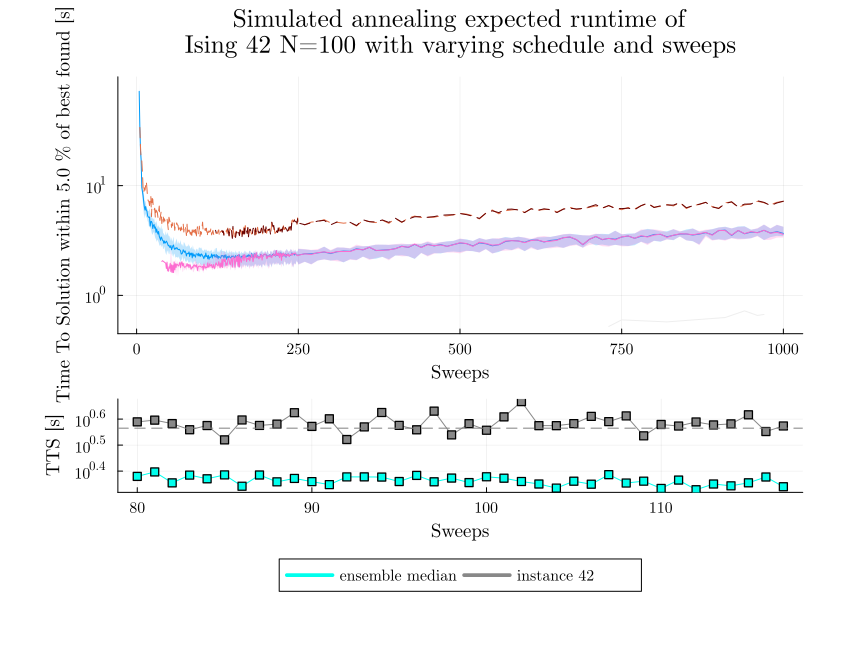

In [37]:
clean_for_min(values) = [
    (v isa Number && isfinite(v)) ? Float64(v) : Inf
    for v in values
]
clean_for_plot(values) = [
    (v isa Number && isfinite(v)) ? Float64(v) : NaN
    for v in values
]

plt_main = plot(
    size = (850, 650),
    layout = @layout([a{0.66h}; b{0.24h}; leg{0.10h}]),
    plot_title = "Simulated annealing expected runtime of\nIsing 42 N=100 with varying schedule and sweeps",
    yscale = :log10,
    ylabel = "Time To Solution within $threshold % of best found [s]",
    xlabel = "Sweeps",
    legend = false,
    left_margin = 10mm,
    right_margin = 10mm,
    plot_titlevspan = 0.1,
)

schedules_to_plot = ["geometric"]
median_tts_inset = Float64[]
clean_vec_42_inset = Float64[]

for boot in reverse(boots)
    for schedule in schedules_to_plot
        results_array = vcat([
            transpose(clean_for_plot(all_results[i][:ttt][boot][schedule]))
            for i in instances
        ]...)

        tsplotboot!(
            plt_main,
            sweeps,
            results_array,
            "bootstrap";
            seed_parts=(bootstrap_seed, SEED_TAG_ENSEMBLE_TTS, boot),
            label="Ensemble $schedule with $boot reads",
            subplot=1,
        )

        instance_curve = clean_for_plot(results[:ttt][boot][schedule])
        plot!(plt_main, sweeps, instance_curve;
            subplot=1,
            label="Instance $(schedule)_boot$boot",
            linestyle=:dash,
        )

        if boot == default_sweeps
            median_tts_inset = vec(nanmedian(results_array, dims=1))
            clean_vec_42_inset = clean_for_plot(results[:ttt][default_sweeps][schedule])
            min_median_tts_val, min_median_index = findmin(clean_for_min(median_tts_inset))
            min_median_sweep = sweeps[min_median_index]
            min_tts_42_val, min_index_42 = findmin(clean_for_min(clean_vec_42_inset))
            min_sweep_42 = sweeps[min_index_42]
            println("minimum median TTS for $schedule schedule = $min_median_tts_val s at sweep = $min_median_sweep")
            println("minimum TTS for instance 42 with $schedule schedule = $min_tts_42_val s at sweep = $min_sweep_42")
        end
    end
end

plot!(
    plt_main;
    subplot = 2,
    yscale = :log10,
    ylabel = "TTS [s]",
    xlabel = "Sweeps",
    legend = false,
)

plot_range = zoom_window_from_series(median_tts_inset, clean_vec_42_inset; pad=5)
plot!(plt_main, sweeps[plot_range], median_tts_inset[plot_range];
    subplot=2,
    linestyle=:solid,
    marker=:square,
    color=:orange,
    label="",
)
plot!(plt_main, sweeps[plot_range], clean_vec_42_inset[plot_range];
    subplot=2,
    linestyle=:solid,
    marker=:square,
    color=:blue,
    label="",
)

default_vals = [
    let v = all_results[i][:ttt][default_sweeps]["geometric"][end]
        v isa Number ? (isfinite(v) ? Float64(v) : NaN) : NaN
    end
    for i in instances
]
finite_default_vals = finite_values(default_vals)
median_default = isempty(finite_default_vals) ? NaN : median(finite_default_vals)
hline!(plt_main, [median_default]; subplot=2, linestyle=:dash, color=:gray, label="")

plot!(
    plt_main[3];
    framestyle = :none,
    showaxis = false,
    grid = false,
    legend = :top,
    legend_column = 2,
)
plot!(plt_main[3], [0.0, 1.0], [0.0, 0.0]; color=:orange, linewidth=3, label="ensemble median")
plot!(plt_main[3], [0.0, 1.0], [0.0, 0.0]; color=:blue, linewidth=3, label="instance 42")

display(plt_main)


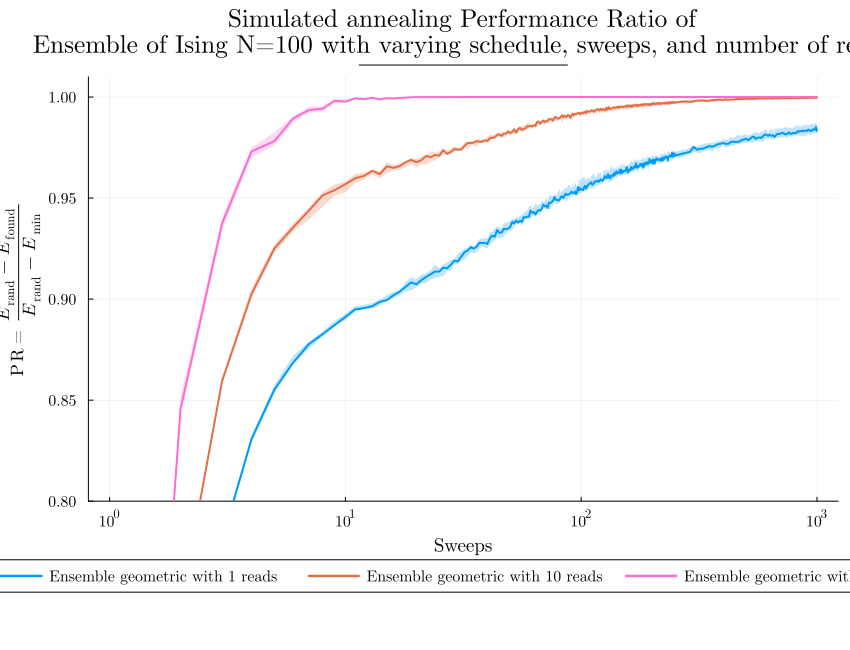

In [38]:
plt_approx = plot(
    size = (850, 650),
    plot_title = "Simulated annealing Performance Ratio of\nEnsemble of Ising N=100 with varying schedule, sweeps, and number of reads",
    xlabel = "Sweeps",
    ylabel = performance_ratio_label,
    xscale = :log10,
    xticks = 10.0.^(0:3),
    ylims = (0.8, 1.01),
    legend = :outerbottom,
    legend_columns = 3,
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern"),
)

schedules_to_plot = ["geometric"]

for boot in boots
    for schedule in schedules_to_plot
        best_array = vcat([
            transpose(clean_for_plot(all_results[i][:best][boot][schedule]))
            for i in instances
        ]...)

        tsplotboot!(
            plt_approx,
            sweeps,
            best_array,
            "bootstrap";
            seed_parts=(bootstrap_seed, SEED_TAG_ENSEMBLE_PR_SWEEPS, boot),
            label="Ensemble $schedule with $boot reads",
            linewidth=2,
        )
    end
end

display(plt_approx)


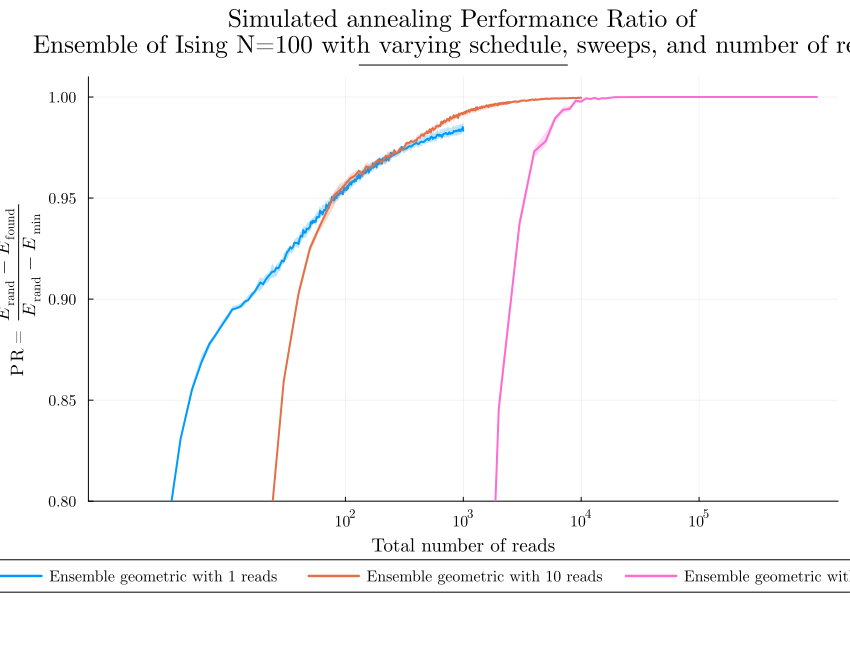

In [39]:
plt_total_reads = plot(
    size = (850, 650),
    plot_title = "Simulated annealing Performance Ratio of\nEnsemble of Ising N=100 with varying schedule, sweeps, and number of reads",
    xlabel = "Total number of reads",
    ylabel = performance_ratio_label,
    xscale = :log10,
    xticks = 10.0.^(2:5),
    ylims = (0.8, 1.01),
    legend = :outerbottom,
    legend_columns = 3,
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern"),
)

schedules_to_plot = ["geometric"]

for boot in boots
    reads = [s * boot for s in sweeps]
    for schedule in schedules_to_plot
        best_array = vcat([
            transpose(clean_for_plot(all_results[i][:best][boot][schedule]))
            for i in instances
        ]...)

        tsplotboot!(
            plt_total_reads,
            reads,
            best_array,
            "bootstrap";
            seed_parts=(bootstrap_seed, SEED_TAG_ENSEMBLE_PR_READS, boot),
            label="Ensemble $schedule with $boot reads",
            linewidth=2,
        )
    end
end

display(plt_total_reads)


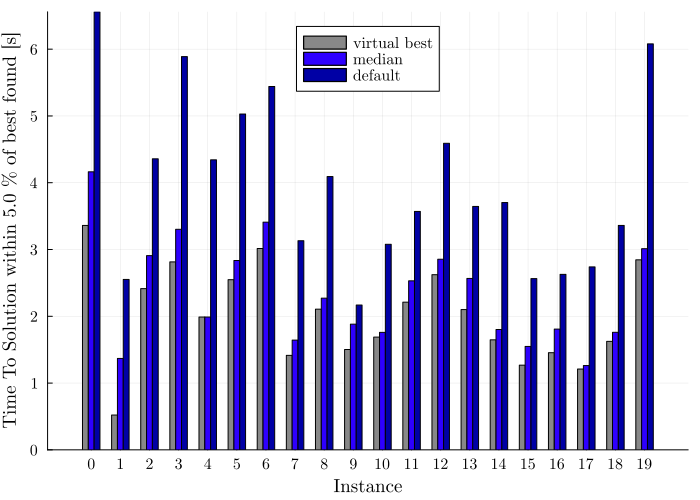

In [40]:
"""
Cleans a vector for use with `minimum` or `argmin`.
Replaces `nothing`, `NaN`, and `Inf` with `Inf`.
"""
function clean_vec_for_min(raw_vec)
    return [
        (v isa Number && isfinite(v)) ? v : Inf 
        for v in raw_vec
    ]
end

"""
Cleans a single value for plotting.
Replaces `nothing`, `NaN`, or `Inf` with `NaN` so it doesn't plot.
"""
function clean_val_for_plot(val)
    return (val isa Number && isfinite(val)) ? val : NaN
end


data_list_inset = []
for i in instances
    raw_vec = all_results[i][:ttt][default_sweeps]["geometric"]
    clean_vec = [v isa Number ? (isfinite(v) ? v : NaN) : NaN for v in raw_vec]
    push!(data_list_inset, transpose(clean_vec))
end
results_array_inset = vcat(data_list_inset...)
median_tts_inset = nanmedian(results_array_inset, dims=1)[1,:]
min_median_val, min_median_index = findmin(clean_vec_for_min(median_tts_inset))


raw_tts_vectors = [all_results[i][:ttt][default_sweeps]["geometric"] for i in instances]

cleaned_tts_vectors = [clean_vec_for_min(v) for v in raw_tts_vectors]

minima = [minimum(v) for v in cleaned_tts_vectors]

median_all = [clean_val_for_plot(v[min_median_index]) for v in raw_tts_vectors]

default = [clean_val_for_plot(v[end]) for v in raw_tts_vectors]

plt_bar = plot(
    size = (700, 500),
    xlabel = "Instance",
    ylabel = "Time To Solution within $threshold % of best found [s]",
    legend = :top,
    
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

bar!(plt_bar, instances .- 0.2, minima, 
     bar_width=0.2, label="virtual best", color=:blue)
     
bar!(plt_bar, instances, median_all, 
     bar_width=0.2, label="median", color=:green)
     
bar!(plt_bar, instances .+ 0.2, default, 
     bar_width=0.2, label="default", color=:red)

plot!(plt_bar, xticks = instances)

display(plt_bar)

Notice how much performance we lose by using the default sweep across all these instances, and how much we could gain if we somehow knew the best sweep for each instance.


Calculating optimal sweep for instance 42...
Minimum TTS for instance 42 = 3.3120138340301897s at sweep = 85
Minimum MEDIAN TTS (all instances) at sweep = 112
Processing sweep 85 for schedule geometric...
Processing sweep 1000 for schedule geometric...


Processing sweep 10 for schedule geometric...


Processing sweep 500 for schedule geometric...


Processing sweep 112 for schedule geometric...


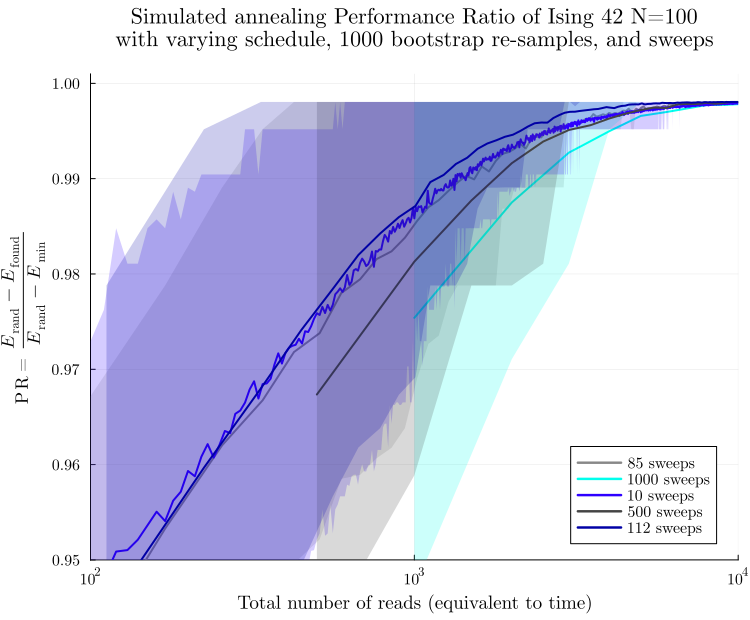

In [41]:
println("Calculating optimal sweep for instance 42...")
local min_sweep
ttt_data_42 = results[:ttt][default_sweeps]["geometric"]
finite_ttt_data_42 = [
    (t isa Number && isfinite(t)) ? Float64(t) : Inf
    for t in ttt_data_42
]
min_ttt_42, min_index_42 = findmin(finite_ttt_data_42)
min_sweep = sweeps[min_index_42]

min_median_sweep = sweeps[min_median_index]

println("Minimum TTS for instance 42 = $(min_ttt_42)s at sweep = $(min_sweep)")
println("Minimum MEDIAN TTS (all instances) at sweep = $(min_median_sweep)")

interest_sweeps = unique([min_sweep, default_sweeps, 10, 500, min_median_sweep])
n_boot_plot = 1000
boot_range = collect(1:999)

approx_ratio = Dict{String, Dict{Int, Vector{Float64}}}()
approx_ratioci = Dict{String, Dict{Int, Vector{Tuple{Float64, Float64}}}}()
profile_colors = Dict(sweep => color for (sweep, color) in zip(interest_sweeps, [:blue, :orange, :green, :purple, :red]))

p_approx = plot()

for schedule in ["geometric"]
    approx_ratio[schedule] = Dict{Int, Vector{Float64}}()
    approx_ratioci[schedule] = Dict{Int, Vector{Tuple{Float64, Float64}}}()

    schedule_min_energy = results[:min_energy][schedule]
    schedule_random_energy = results[:random_energy][schedule]

    for sweep in interest_sweeps
        println("Processing sweep $sweep for schedule $schedule...")
        sol, _ = load_or_generate_solution(random_ising_model, instance, schedule, sweep; overwrite_pickles=overwrite_pickles)
        all_energies = expand_solution_energies(sol)

        schedule_min_energy = min(schedule_min_energy, minimum(all_energies))
        ratios, ratio_ci = build_performance_ratio_profile(
            all_energies,
            boot_range;
            n_boot=n_boot_plot,
            random_energy=schedule_random_energy,
            min_energy=schedule_min_energy,
            ci=ci,
            seed_parts=(bootstrap_seed, SEED_TAG_INSTANCE_42_TRANSFER_PROFILE, sweep),
        )

        approx_ratio[schedule][sweep] = ratios
        approx_ratioci[schedule][sweep] = ratio_ci

        x_values = [shot * sweep for shot in boot_range]
        lower_bound_series = first.(ratio_ci)
        upper_bound_series = last.(ratio_ci)

        ribbon_low = ratios .- lower_bound_series
        ribbon_high = upper_bound_series .- ratios

        plot!(p_approx, x_values, ratios;
              label="$sweep sweeps",
              linewidth=2,
              color=profile_colors[sweep],
              ribbon=(ribbon_low, ribbon_high),
              fillalpha=0.2)
    end
end

plot!(p_approx,
    plot_title = "Simulated annealing Performance Ratio of Ising 42 N=100\nwith varying schedule, $n_boot_plot bootstrap re-samples, and sweeps",
    xlabel = "Total number of reads (equivalent to time)",
    ylabel = performance_ratio_label,
    xscale = :log10,
    xticks = 10.0.^(2:4),
    ylims = (0.95, 1.001),
    xlims = (1e2, 1e4),
    legend = :best,
    size = (750, 620),
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(14, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

display(p_approx)


This example shows that for instance 42, using the sweep selected from the ensemble median is better than using the default, although it still does not match the unattainable virtual best for that instance.


After figuring out what would be the best parameter for our instance of interest, it is also useful to look at the ensemble performance.
We can compare the default sweep, the sweep selected from the ensemble statistic, and the unattainable virtual best where each instance gets its own optimal sweep.
This helps us understand how much is at stake in the parameter choice.


In [42]:
n_boot_plot = 100
schedules_for_plot = ["geometric"]
boot_range = collect(1:(total_reads - 1))
overwrite_pickles = false

indices = Int[]
for i in instances
    raw_vec = all_results[i][:ttt][default_sweeps]["geometric"]
    push!(indices, argmin(clean_vec_for_min(raw_vec)))
end

min_median_sweep = sweeps[min_median_index]
virtual_best_sweep = round(Int, median([sweeps[idx] for idx in indices]))
interest_sweeps_keys = [string(min_median_sweep), string(default_sweeps), "best"]
profile_colors = Dict(
    string(default_sweeps) => "#1f77b4",
    string(min_median_sweep) => "#ff7f0e",
    "best" => "#2ca02c",
)

all_approx_ratio = Dict{Int, Dict{String, Dict{String, Any}}}()
for instance in instances
    all_approx_ratio[instance] = Dict{String, Dict{String, Any}}()
    for schedule in schedules_for_plot
        all_approx_ratio[instance][schedule] = Dict{String, Any}()
    end
end

plt_final = plot(
    size = (780, 620),
    title = "Simulated annealing Performance Ratio of Ising Ensemble N=100\nwith varying schedule, $n_boot_plot bootstrap re-samples, and sweeps",
    xlabel = "Total number of reads (equivalent to time)",
    ylabel = performance_ratio_label,
    xscale = :log10,
    xticks = 10.0.^(2:4),
    ylims = (0.95, 1.001),
    xlims = (1e2, 1e4),
    legend = :outerbottom,
    legend_columns = 1,
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(14, "Computer Modern"),
    guidefont       = Plots.font(10, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

for instance in instances
    println("Processing instance $instance...")
    _, _, instance_model = build_random_ising_instance(instance, n)
    set_optimizer(instance_model, DWave.Neal.Optimizer)

    for sweep_key in interest_sweeps_keys
        flag_best = false
        current_sweep = sweep_key == "best" ? sweeps[indices[instance + 1]] : parse(Int, sweep_key)
        flag_best = sweep_key == "best"
        schedule = "geometric"

        min_energy = all_results[instance][:min_energy]["geometric"]
        random_energy = all_results[instance][:random_energy]["geometric"]
        sol, _ = load_or_generate_solution(instance_model, instance, schedule, current_sweep; overwrite_pickles=overwrite_pickles)
        all_energies = expand_solution_energies(sol)
        min_energy = min(min_energy, minimum(all_energies))

        ratios, _ = build_performance_ratio_profile(
            all_energies,
            boot_range;
            n_boot=n_boot_plot,
            random_energy=random_energy,
            min_energy=min_energy,
            ci=ci,
            seed_parts=(bootstrap_seed, SEED_TAG_ENSEMBLE_TRANSFER_PROFILE, instance, current_sweep),
        )

        plot_key = flag_best ? "best" : string(current_sweep)
        all_approx_ratio[instance][schedule][plot_key] = ratios

        x_values = [shot * current_sweep for shot in boot_range]
        plot!(plt_final, x_values, ratios;
              color=:lightgray, label="", alpha=flag_best ? 0.7 : 0.3, linewidth=0.8)
    end
end


Processing instance 0...


Processing instance 1...


Processing instance 2...


Processing instance 3...


Processing instance 4...


Processing instance 5...


Processing instance 6...


Processing instance 7...


Processing instance 8...


Processing instance 9...


Processing instance 10...


Processing instance 11...


Processing instance 12...


Processing instance 13...


Processing instance 14...


Processing instance 15...


Processing instance 16...


Processing instance 17...


Processing instance 18...


Processing instance 19...


Plotting ensemble data...


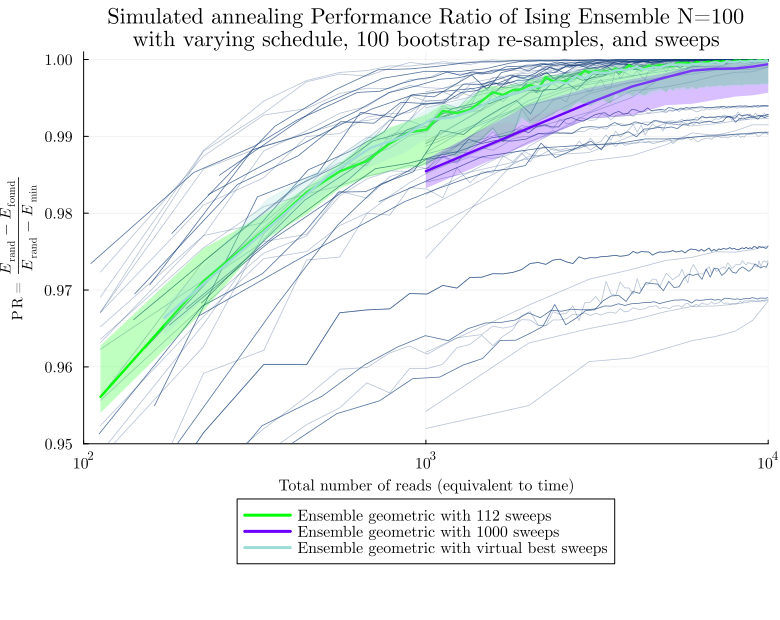

In [43]:
println("Plotting ensemble data...")
for sweep_key in interest_sweeps_keys
    schedule = "geometric"

    approx_ratio_array = vcat([
        transpose(all_approx_ratio[i][schedule][sweep_key])
        for i in instances
    ]...)

    if sweep_key == "best"
        label_plot = "Ensemble $schedule with virtual best sweeps"
        current_sweep_for_x = virtual_best_sweep
    else
        current_sweep_for_x = parse(Int, sweep_key)
        label_plot = "Ensemble $schedule with $sweep_key sweeps"
    end

    reads = [shot * current_sweep_for_x for shot in boot_range]

    tsplotboot!(
        plt_final,
        reads,
        approx_ratio_array,
        "bootstrap";
        seed_parts=(bootstrap_seed, SEED_TAG_ENSEMBLE_TRANSFER_PROFILE, current_sweep_for_x),
        label=label_plot,
        linewidth=2.4,
        color=profile_colors[sweep_key],
    )
end

display(plt_final)


As you can see, there is a gap between the ensemble-selected sweep and the virtual best.
That gap is small in this example, but it can become much larger as the parameter space grows, making parameter selection both more valuable and more difficult.
We are actively working on such parameter-setting strategies and expect to report further progress in this area.
